In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras import backend as K
import warnings
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

In [ ]:
warnings.filterwarnings("ignore")

In [ ]:
def load_and_preprocess_station_data(station_id):
    """
    Read the 3 CSVs for a station, merge on 'data', interpolate missing
    values and return 5 subsets with decreasing size (as dict).

    """
    csv_files = {
        'PM1': f'{station_id}.PM1.csv',
        'PM2.5': f'{station_id}.PM2.5.csv',
        'PM10': f'{station_id}.PM10.csv'
    }

    dataframes = {}
    for col_base, file in csv_files.items():
        df = pd.read_csv(file, skiprows=3)
        df = df[['date', 'median']]
        df.rename(columns={'median': col_base}, inplace=True)
        dataframes[col_base] = df

    merged_df = dataframes['PM1']
    for col_name in ['PM2.5', 'PM10']:
        merged_df = pd.merge(merged_df, dataframes[col_name], on='date', how='inner')

    merged_df['date'] = pd.to_datetime(merged_df['date'])
    merged_df.set_index('date', inplace=True)

    full_index = pd.date_range(start=merged_df.index.min(), end=merged_df.index.max(), freq='D')
    merged_df = merged_df.reindex(full_index)
    merged_df = merged_df.interpolate(method='linear')

    merged_df.reset_index(inplace=True)
    merged_df.rename(columns={'index': 'date'}, inplace=True)

    max_rows = len(merged_df)
    dfs = {}
    for i in range(5):
        num_rows = max_rows - i * 30
        print(num_rows)
        dfs[f'subset_{i+1}'] = merged_df.iloc[:num_rows].copy()

    return dfs

In [ ]:
all_station_data = {}
for station_id in range(1, 5):
    all_station_data[station_id] = load_and_preprocess_station_data(station_id)

847
817
787
757
727
798
768
738
708
678
1200
1170
1140
1110
1080
1898
1868
1838
1808
1778


In [ ]:
# Function for creating sequences
def create_sequences(data, seq_length):
    sequences, labels = [], []
    for i in range(len(data) - seq_length):
        sequences.append(data[i:i+seq_length])
        labels.append(data[i+seq_length])
    return np.array(sequences), np.array(labels)

In [ ]:
def train_and_evaluate_lstm(dfs, seq_length=10, station_id=0):
    mae_results = []
    best_model = None

    for i in range(1, 6):
        df_temp = dfs[f'subset_{i}'].copy()

        if len(df_temp) <= seq_length + 30:
            print(f"[{station_id}] [{i}] Not enough data for training and testing.")
            continue

        features = df_temp[['PM1', 'PM2.5', 'PM10']].values
        train_data = features[:-30]
        test_data = features[-(30 + seq_length):]

        scaler = MinMaxScaler()
        train_scaled = scaler.fit_transform(train_data)
        test_scaled = scaler.transform(test_data)

        X_train, y_train = create_sequences(train_scaled, seq_length)
        X_test, y_test = create_sequences(test_scaled, seq_length)

        K.clear_session()
        model = Sequential([
            Input(shape=(seq_length, 3)),
            LSTM(50, return_sequences=True),
            Dropout(0.2),
            LSTM(50, return_sequences=False),
            Dropout(0.2),
            Dense(3)
        ])

        model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])

        history = model.fit(
            X_train, y_train,
            epochs=50,
            batch_size=16,
            validation_split=0.2,
            verbose=0
        )

        if i == 1:
            best_model = model
            best_scaler = scaler
            full_data = features  # for further prediction
            full_dates = df_temp['date'].values  # all the real dates

        # Plot loss & mae
        plt.figure(figsize=(8, 4))
        plt.plot(history.history['loss'], label='train loss')
        plt.plot(history.history['val_loss'], label='val loss')
        plt.title(f'Station {station_id} — Set {i} — Loss vs Val Loss')
        plt.xlabel('Epoch')
        plt.ylabel('MSE loss')
        plt.legend()
        plt.show()

        plt.figure(figsize=(8, 4))
        plt.plot(history.history['mae'], label='train MAE')
        plt.plot(history.history['val_mae'], label='val MAE')
        plt.title(f'Station {station_id} — Set {i} — MAE vs Val MAE')
        plt.xlabel('Epoch')
        plt.ylabel('MAE (scaled)')
        plt.legend()
        plt.show()

        preds_test = model.predict(X_test, verbose=0)
        preds_test = scaler.inverse_transform(preds_test)
        y_test_inv = scaler.inverse_transform(y_test)

        preds_train = model.predict(X_train, verbose=0)
        preds_train = scaler.inverse_transform(preds_train)
        y_train_inv = scaler.inverse_transform(y_train)

        for split, y_true, preds in [
            ('TEST', y_test_inv, preds_test),
            ('TRAIN', y_train_inv, preds_train)
        ]:
            mae_pm1 = mean_absolute_error(y_true[:, 0], preds[:, 0])
            mae_pm25 = mean_absolute_error(y_true[:, 1], preds[:, 1])
            mae_pm10 = mean_absolute_error(y_true[:, 2], preds[:, 2])
            print(f"[{station_id}] [{i}] MAE {split} — PM1: {mae_pm1:.4f}, PM2.5: {mae_pm25:.4f}, PM10: {mae_pm10:.4f}")

            if split == 'TRAIN':
                mae_results.append([mae_pm1, mae_pm25, mae_pm10])

        # Real data for the last 30 test points
        test_dates = df_temp['date'].values[-30:]

        # Show graphs only for TEST: predictions vs actual, one for each PM
        plt.figure(figsize=(15, 4))

        plt.subplot(1, 3, 1)
        plt.plot(test_dates, y_test_inv[:, 0], label='Real PM1')
        plt.plot(test_dates, preds_test[:, 0], label='Pred PM1')
        plt.title(f'Station {station_id} — Set {i} — PM1 Test Real vs Pred (LSTM)')
        plt.xlabel('Date')
        plt.ylabel('PM1')
        plt.legend()
        plt.xticks(rotation=45)

        plt.subplot(1, 3, 2)
        plt.plot(test_dates, y_test_inv[:, 1], label='Real PM2.5')
        plt.plot(test_dates, preds_test[:, 1], label='Pred PM2.5')
        plt.title(f'Station {station_id} — Set {i} — PM2.5 Test Real vs Pred (LSTM)')
        plt.xlabel('Date')
        plt.ylabel('PM2.5')
        plt.legend()
        plt.xticks(rotation=45)

        plt.subplot(1, 3, 3)
        plt.plot(test_dates, y_test_inv[:, 2], label='Real PM10')
        plt.plot(test_dates, preds_test[:, 2], label='Pred PM10')
        plt.title(f'Station {station_id} — Set {i} — PM10 Test Real vs Pred (LSTM)')
        plt.xlabel('Date')
        plt.ylabel('PM10')
        plt.legend()
        plt.xticks(rotation=45)

        plt.tight_layout()
        plt.show()

    return mae_results, best_model, best_scaler, full_data, full_dates


======== LSTM for Station 1 ========


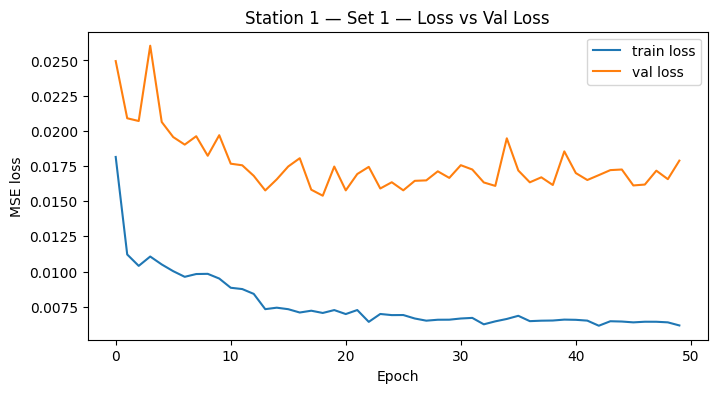

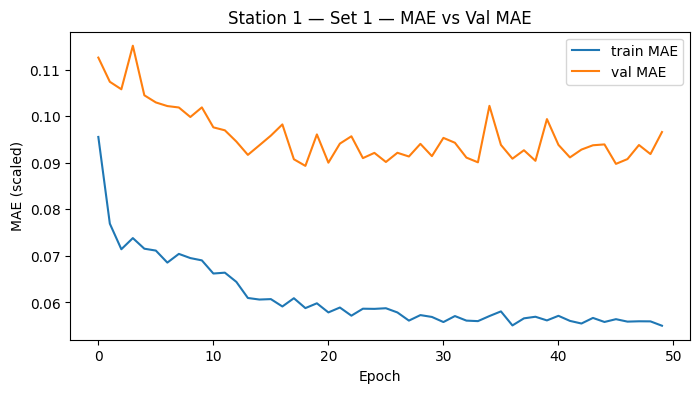

[1] [1] MAE TEST — PM1: 1.6965, PM2.5: 2.6132, PM10: 2.9587
[1] [1] MAE TRAIN — PM1: 2.8401, PM2.5: 4.6365, PM10: 5.6887


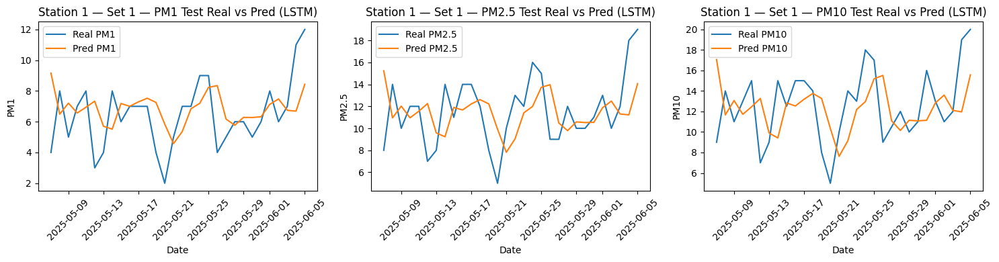

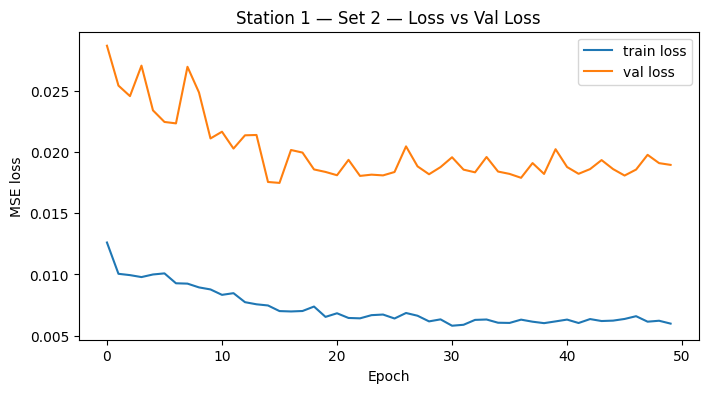

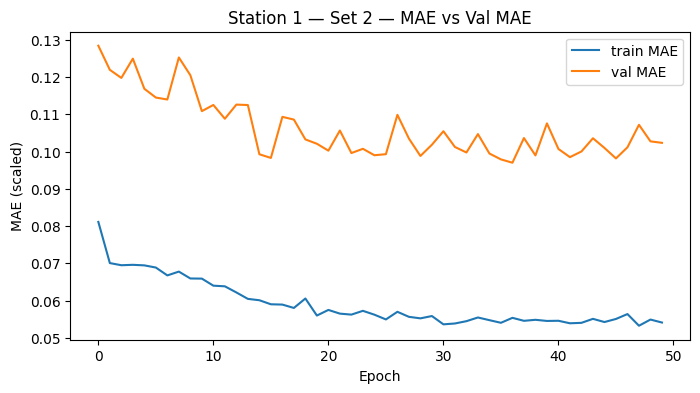

[1] [2] MAE TEST — PM1: 2.1030, PM2.5: 3.1138, PM10: 3.6811
[1] [2] MAE TRAIN — PM1: 2.8147, PM2.5: 4.4992, PM10: 5.6579


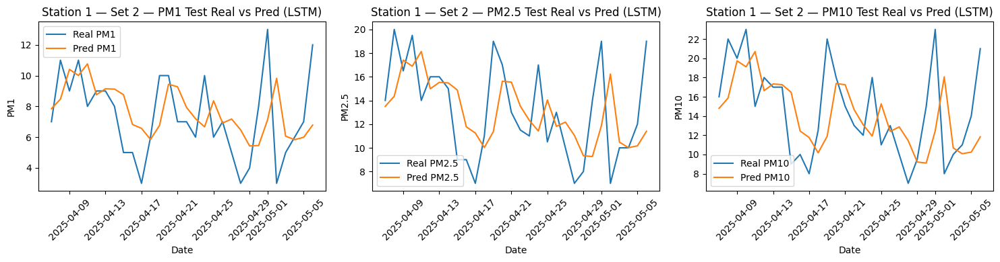

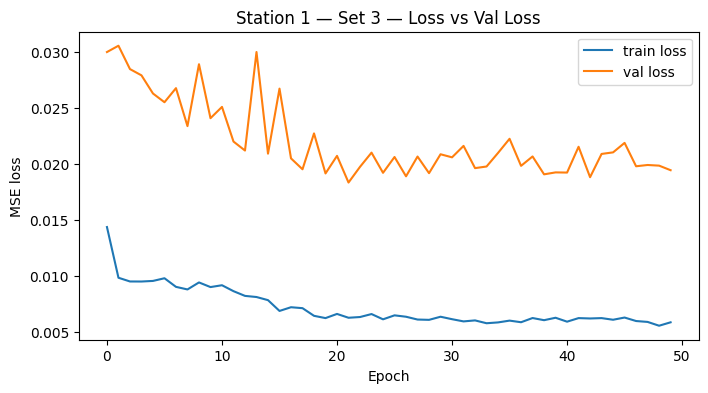

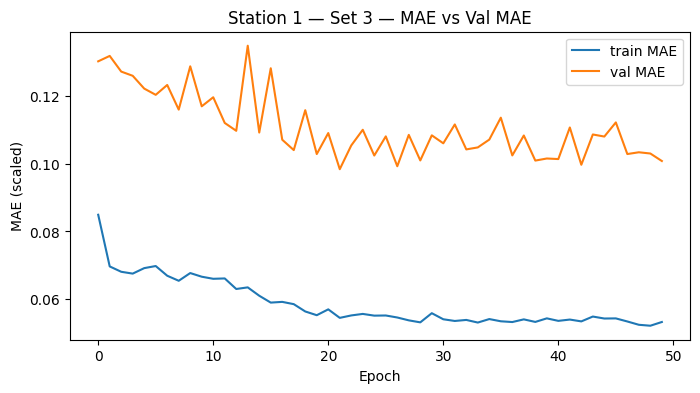

[1] [3] MAE TEST — PM1: 3.5400, PM2.5: 5.6622, PM10: 6.9224
[1] [3] MAE TRAIN — PM1: 2.7919, PM2.5: 4.3992, PM10: 5.4707


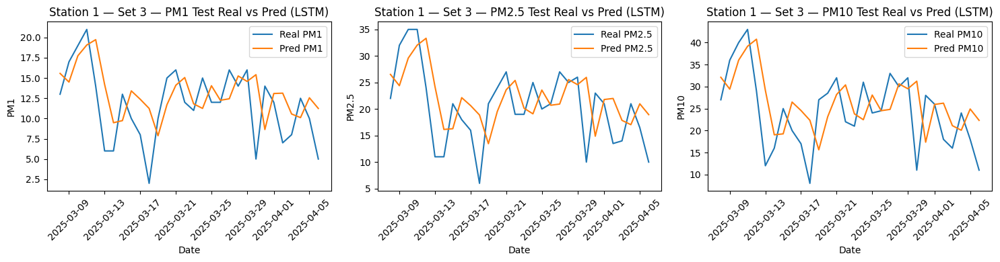

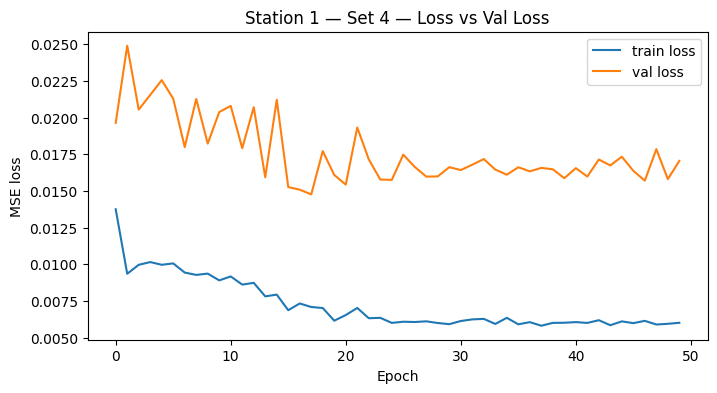

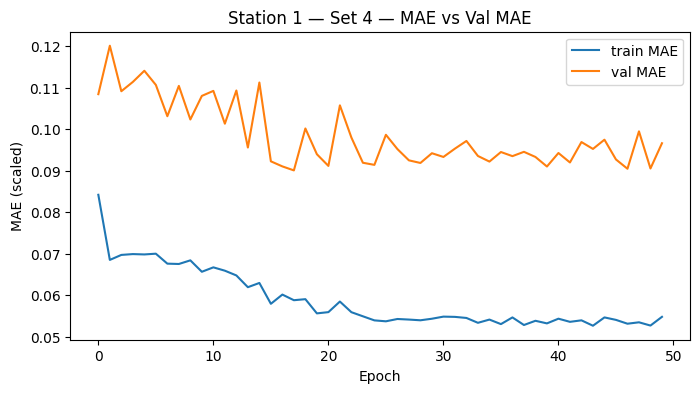

[1] [4] MAE TEST — PM1: 4.9020, PM2.5: 9.1713, PM10: 11.8700
[1] [4] MAE TRAIN — PM1: 2.7471, PM2.5: 4.4208, PM10: 5.5272


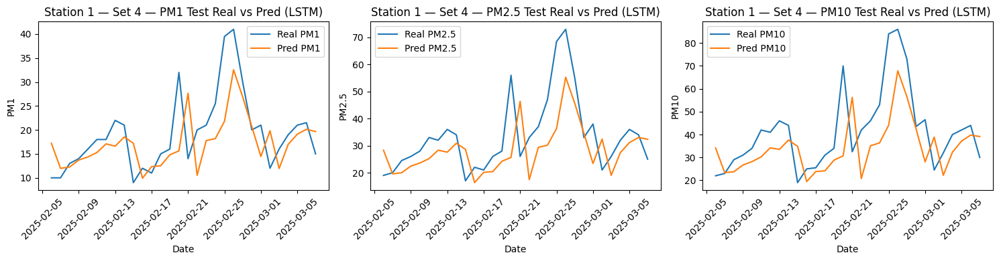

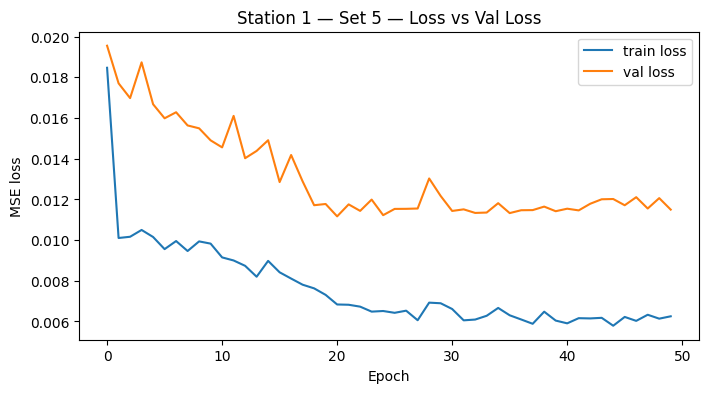

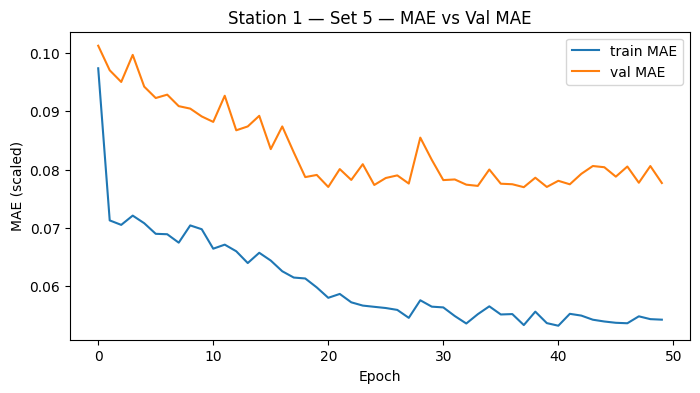

[1] [5] MAE TEST — PM1: 5.1812, PM2.5: 9.0608, PM10: 11.0365
[1] [5] MAE TRAIN — PM1: 2.6184, PM2.5: 4.0599, PM10: 5.0718


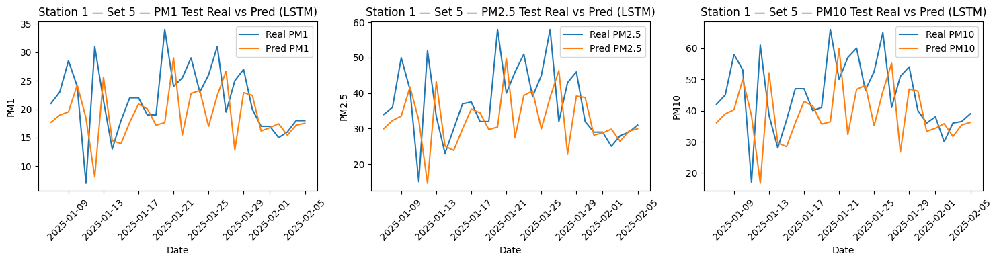


======== LSTM for Station 2 ========


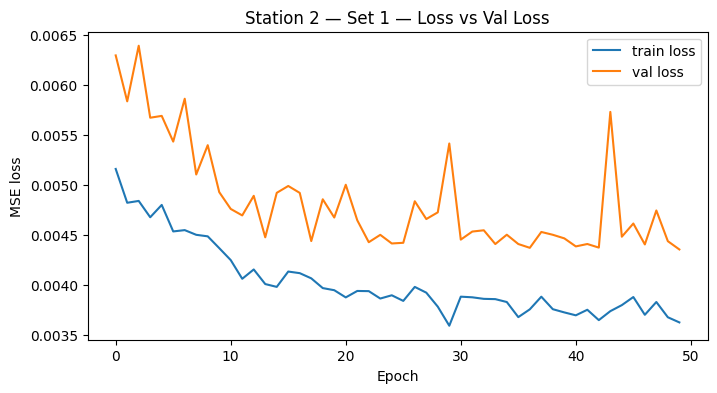

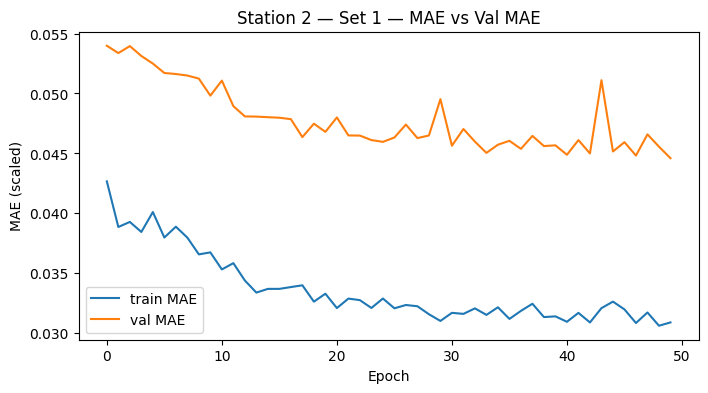

[2] [1] MAE TEST — PM1: 0.5882, PM2.5: 0.8669, PM10: 0.8064
[2] [1] MAE TRAIN — PM1: 1.7689, PM2.5: 2.1670, PM10: 2.3243


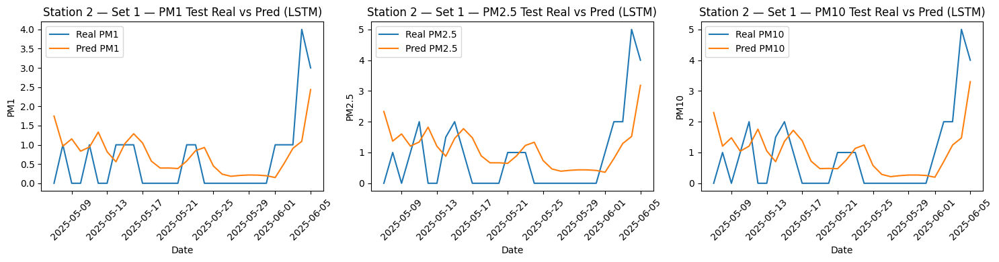

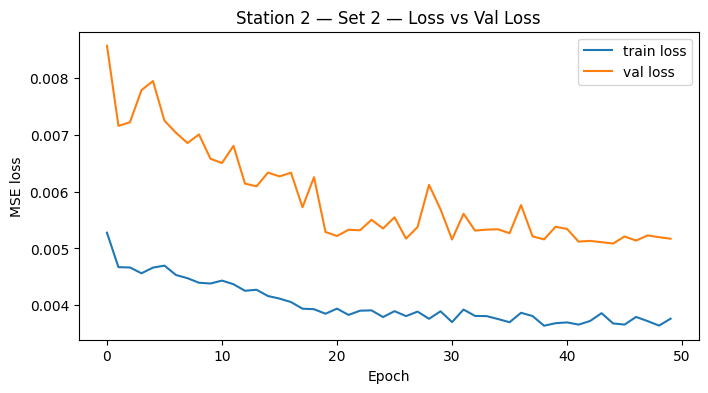

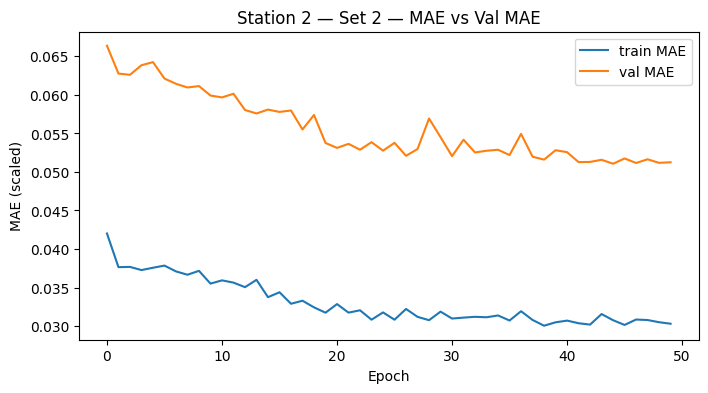

[2] [2] MAE TEST — PM1: 0.8774, PM2.5: 1.0145, PM10: 1.0132
[2] [2] MAE TRAIN — PM1: 1.7721, PM2.5: 2.1602, PM10: 2.3426


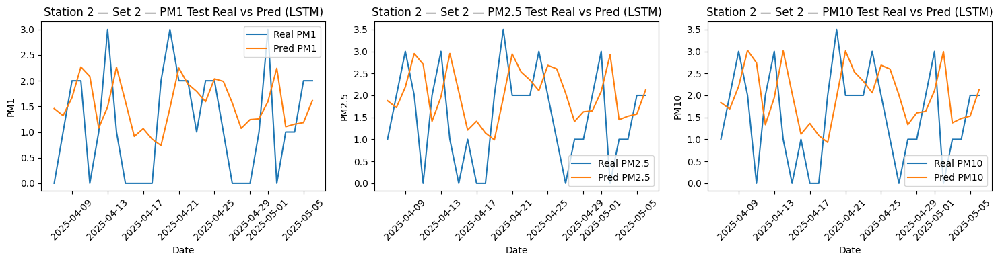

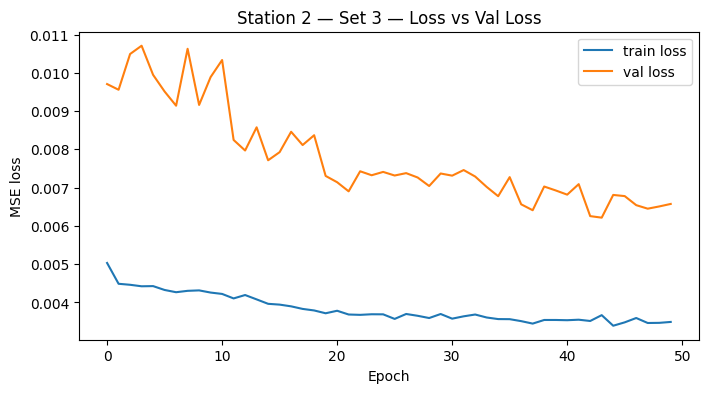

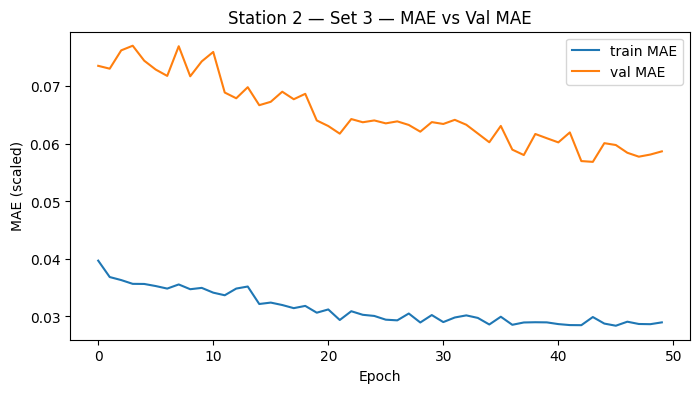

[2] [3] MAE TEST — PM1: 1.7016, PM2.5: 2.1074, PM10: 2.3242
[2] [3] MAE TRAIN — PM1: 1.7773, PM2.5: 2.1809, PM10: 2.3937


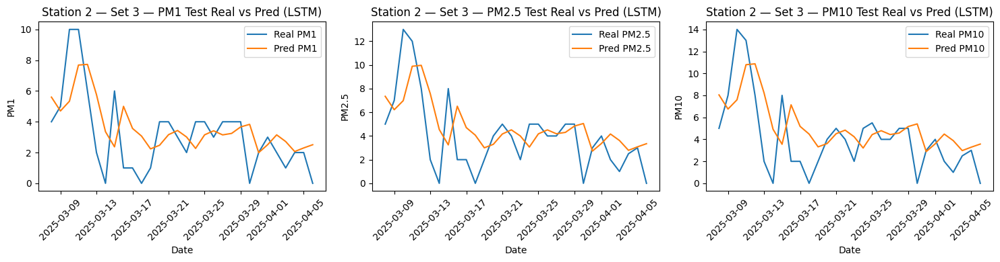

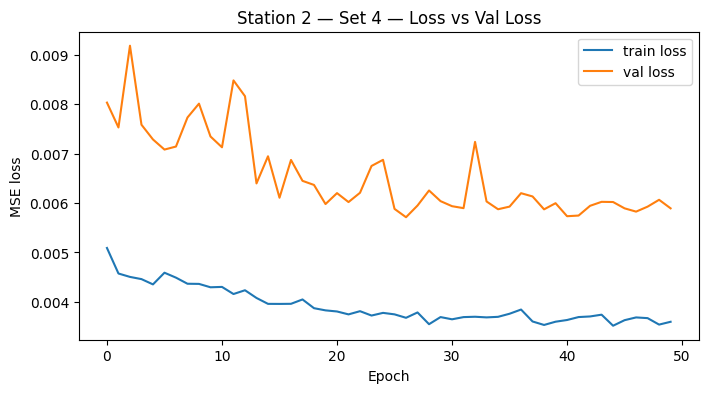

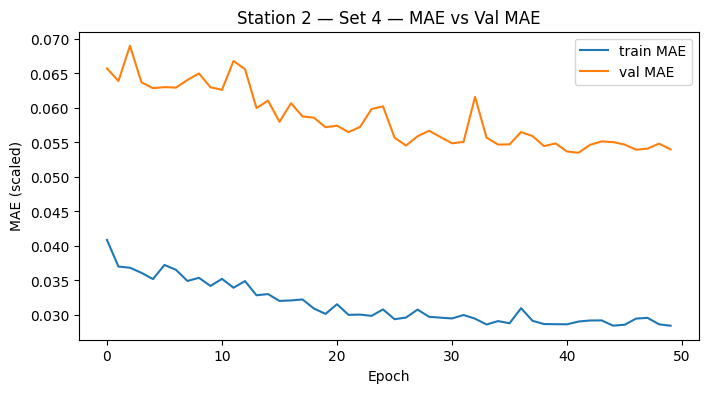

[2] [4] MAE TEST — PM1: 2.7944, PM2.5: 3.4616, PM10: 3.8075
[2] [4] MAE TRAIN — PM1: 1.7606, PM2.5: 2.1241, PM10: 2.2988


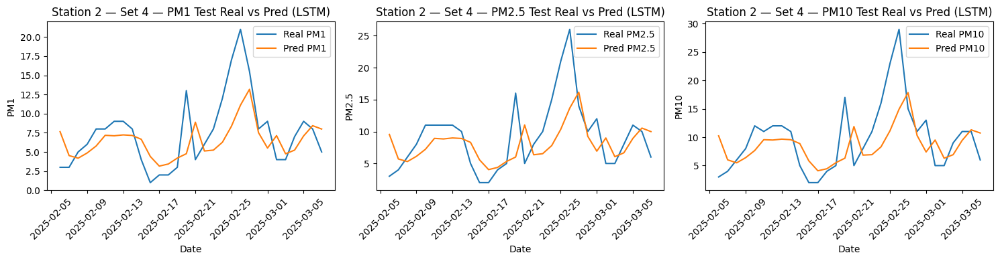

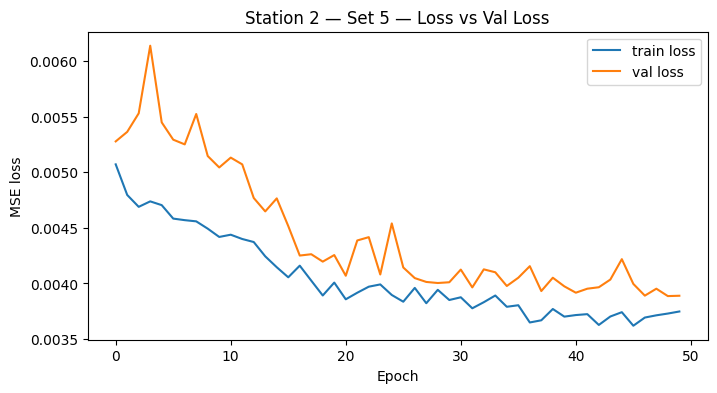

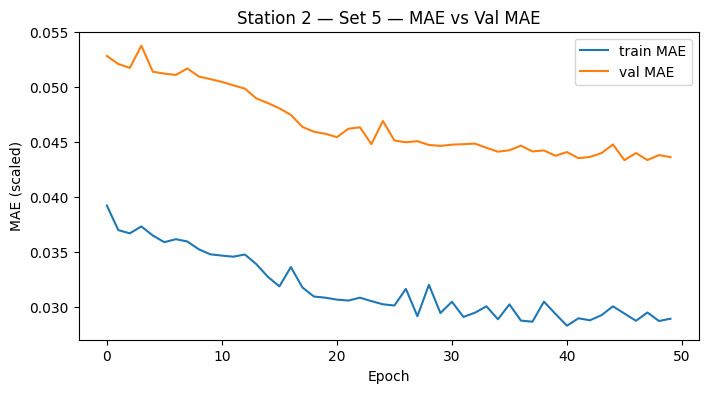

[2] [5] MAE TEST — PM1: 3.9201, PM2.5: 4.7417, PM10: 5.4329
[2] [5] MAE TRAIN — PM1: 1.6511, PM2.5: 2.0219, PM10: 2.1849


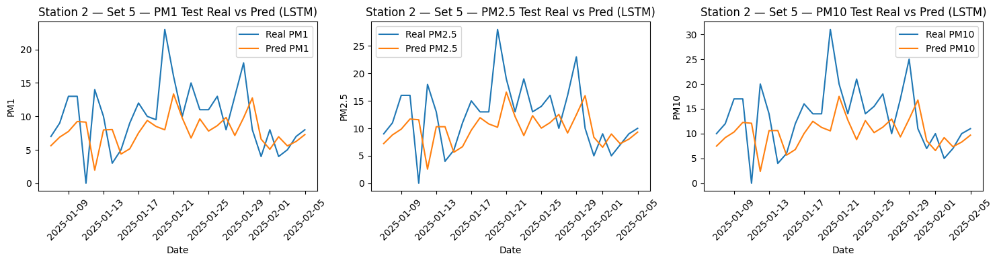


======== LSTM for Station 3 ========


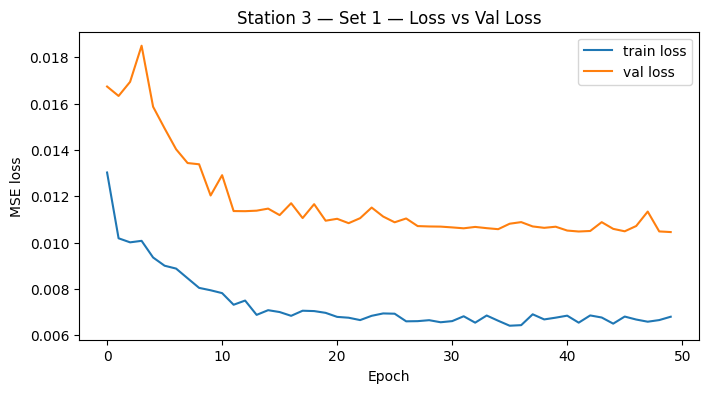

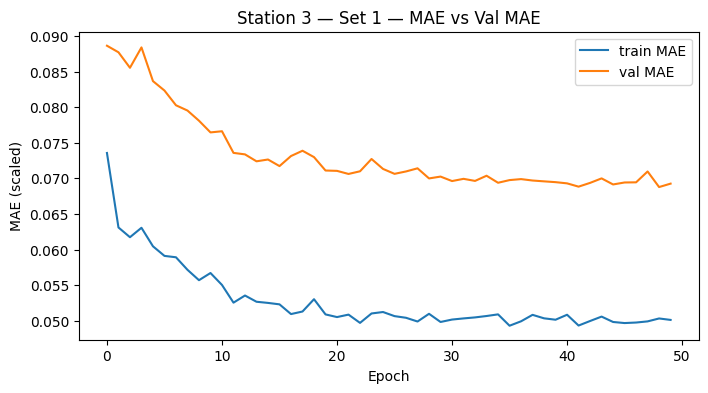

[3] [1] MAE TEST — PM1: 1.0740, PM2.5: 1.4158, PM10: 1.5602
[3] [1] MAE TRAIN — PM1: 3.3552, PM2.5: 4.2467, PM10: 4.8832


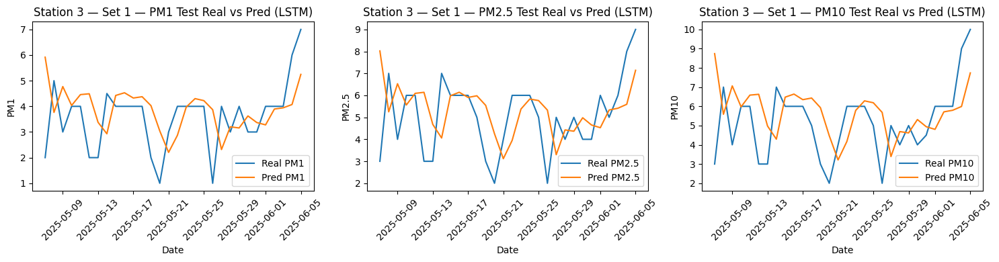

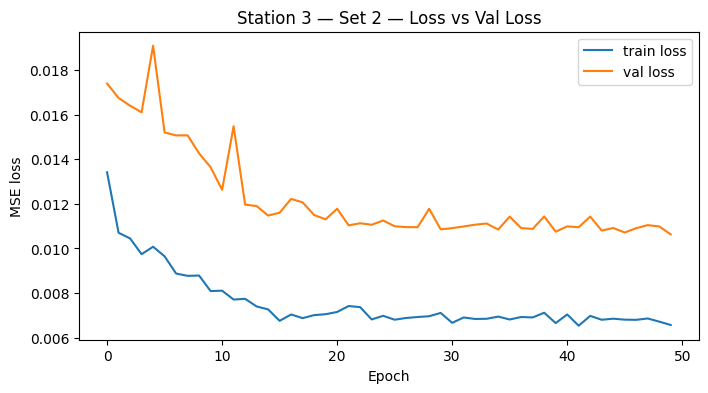

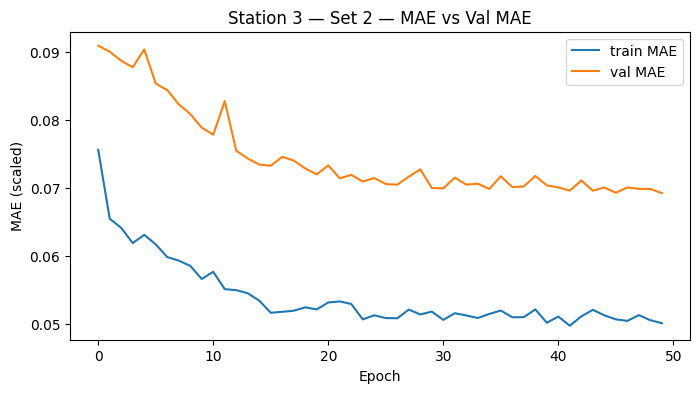

[3] [2] MAE TEST — PM1: 1.7609, PM2.5: 2.1548, PM10: 2.6539
[3] [2] MAE TRAIN — PM1: 3.3792, PM2.5: 4.1937, PM10: 4.9172


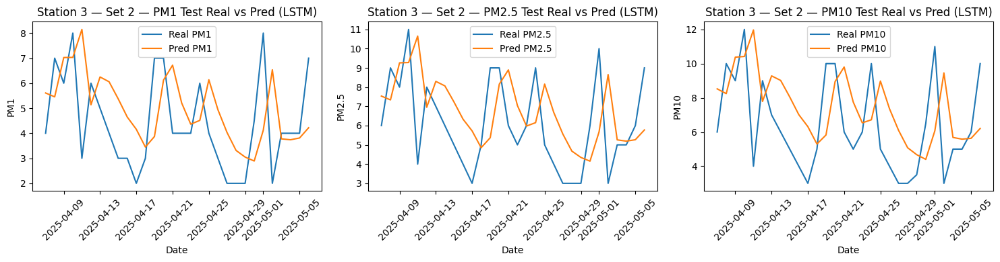

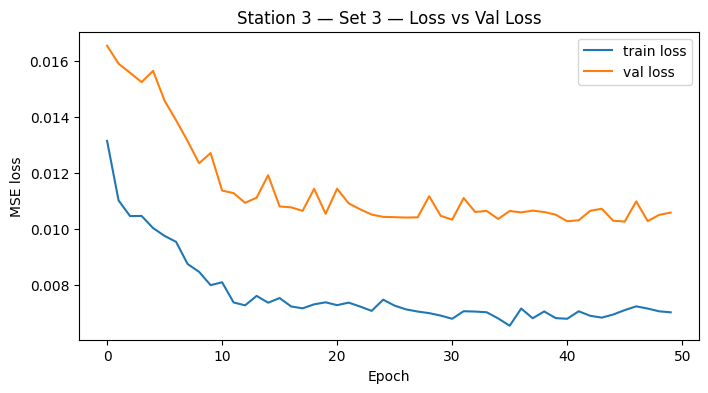

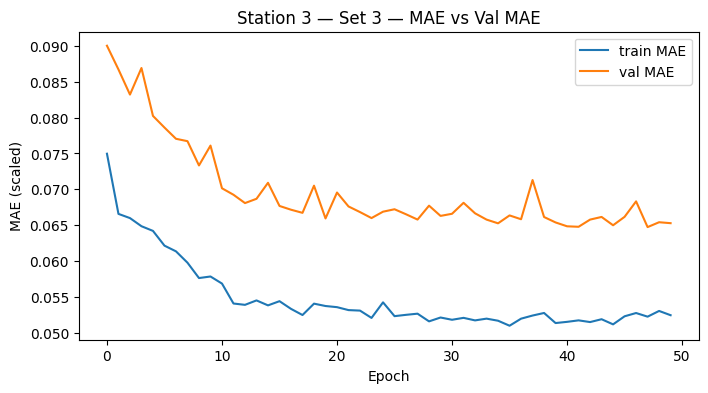

[3] [3] MAE TEST — PM1: 3.4929, PM2.5: 4.3192, PM10: 4.8435
[3] [3] MAE TRAIN — PM1: 3.2952, PM2.5: 4.1406, PM10: 4.7685


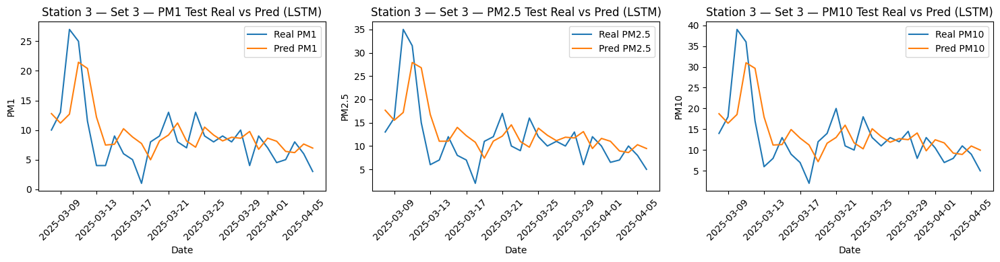

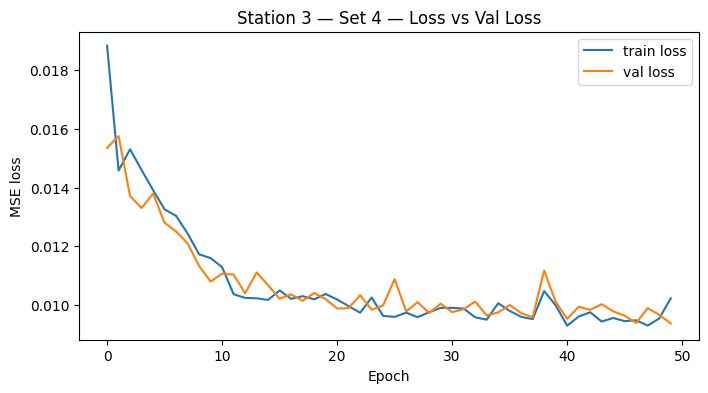

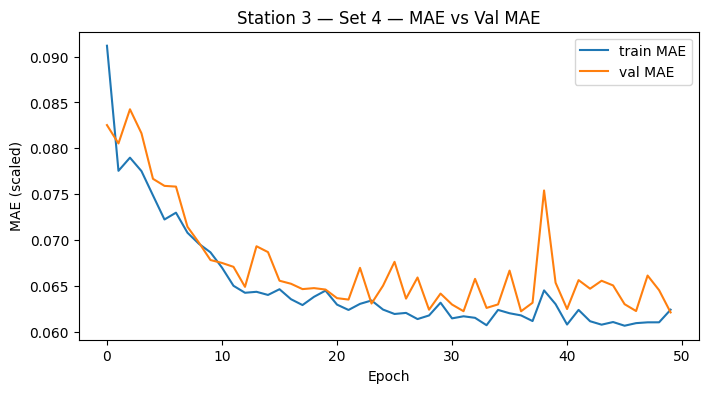

[3] [4] MAE TEST — PM1: 7.0671, PM2.5: 8.6499, PM10: 10.1889
[3] [4] MAE TRAIN — PM1: 3.3486, PM2.5: 4.2480, PM10: 4.7693


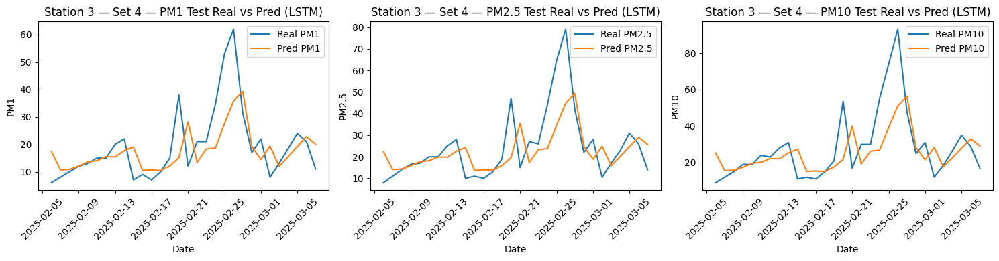

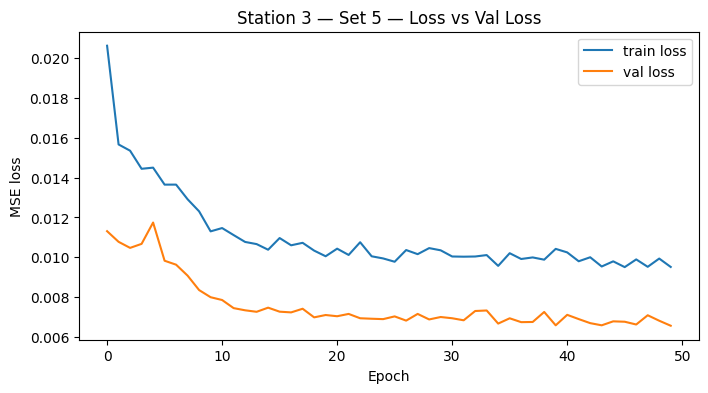

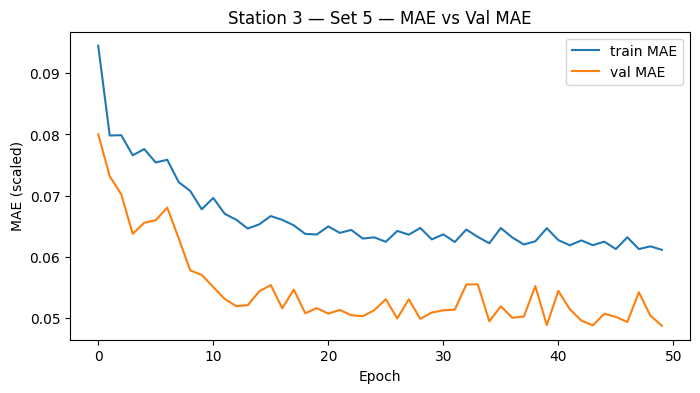

[3] [5] MAE TEST — PM1: 6.3883, PM2.5: 7.7252, PM10: 8.7565
[3] [5] MAE TRAIN — PM1: 3.1368, PM2.5: 3.9999, PM10: 4.5942


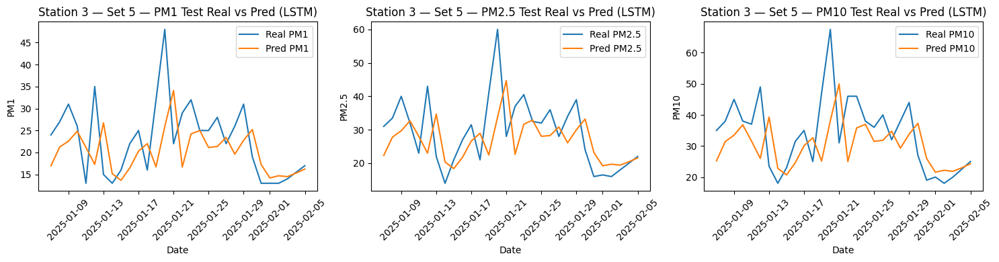


======== LSTM for Station 4 ========


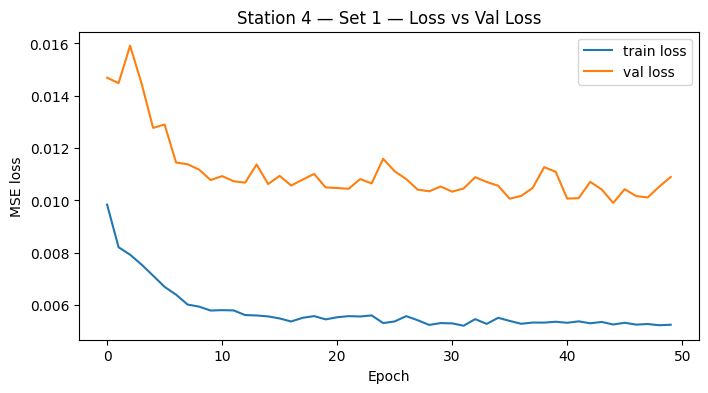

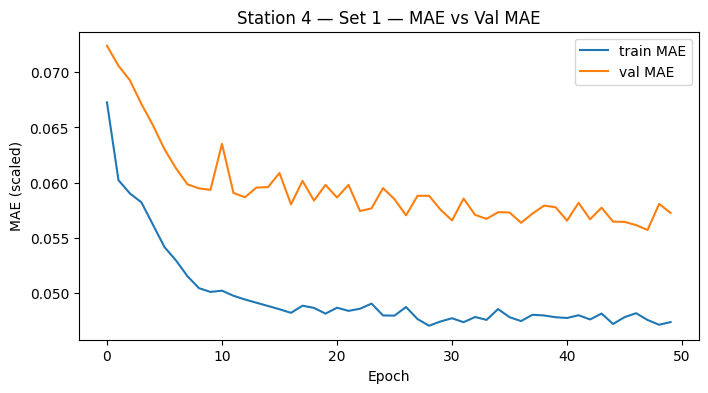

[4] [1] MAE TEST — PM1: 1.5565, PM2.5: 2.7858, PM10: 2.7300
[4] [1] MAE TRAIN — PM1: 3.4585, PM2.5: 5.9660, PM10: 6.3888


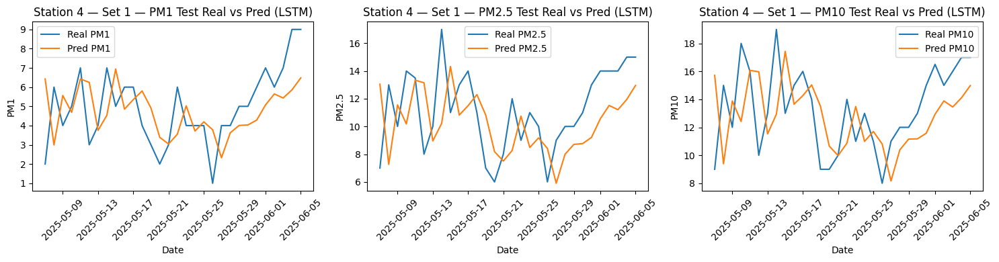

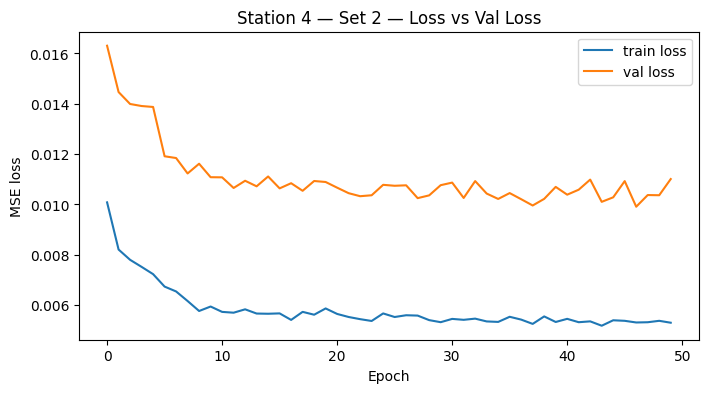

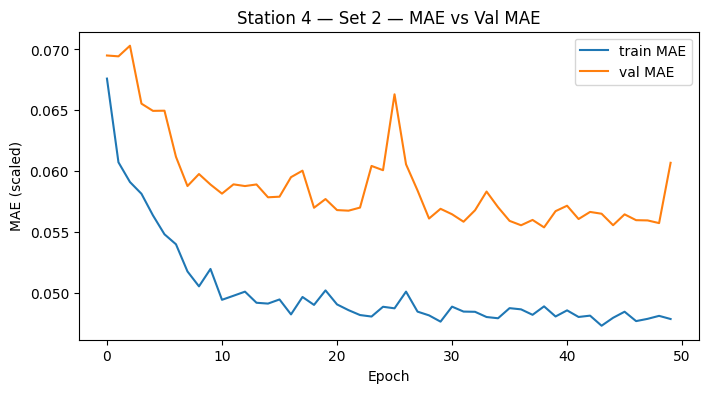

[4] [2] MAE TEST — PM1: 2.4422, PM2.5: 4.3813, PM10: 5.2259
[4] [2] MAE TRAIN — PM1: 3.5577, PM2.5: 6.3197, PM10: 7.2226


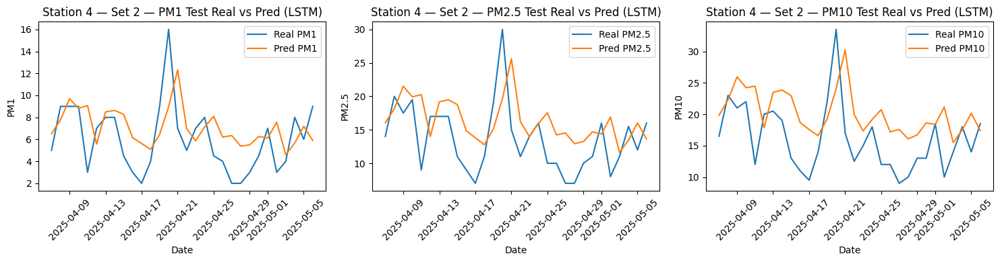

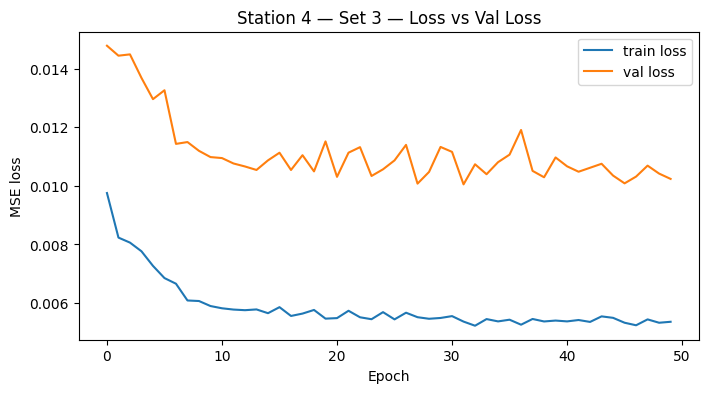

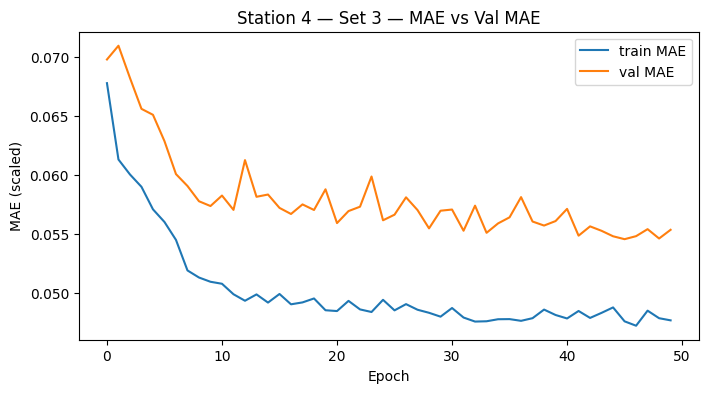

[4] [3] MAE TEST — PM1: 4.4417, PM2.5: 7.6988, PM10: 8.6769
[4] [3] MAE TRAIN — PM1: 3.5262, PM2.5: 5.9930, PM10: 6.3928


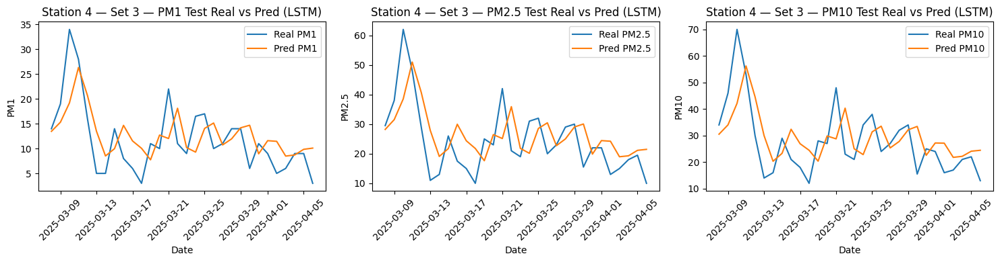

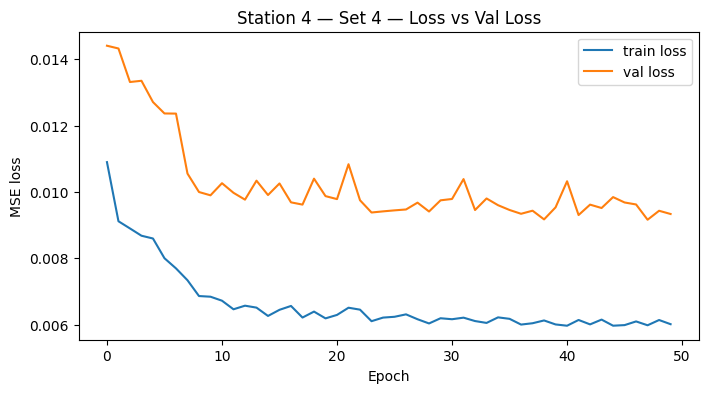

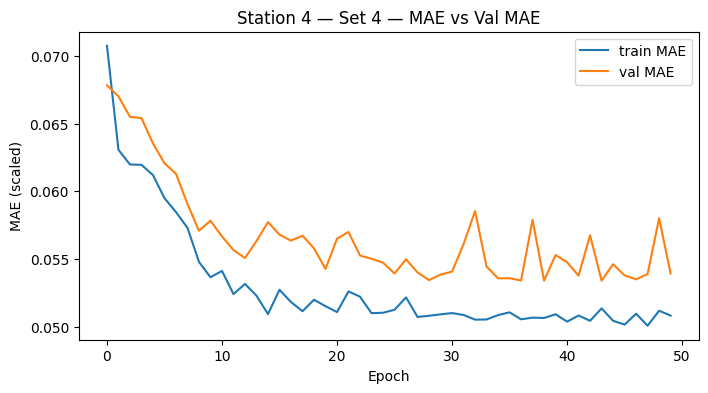

[4] [4] MAE TEST — PM1: 8.0420, PM2.5: 14.2186, PM10: 15.5553
[4] [4] MAE TRAIN — PM1: 3.4403, PM2.5: 5.8604, PM10: 6.2209


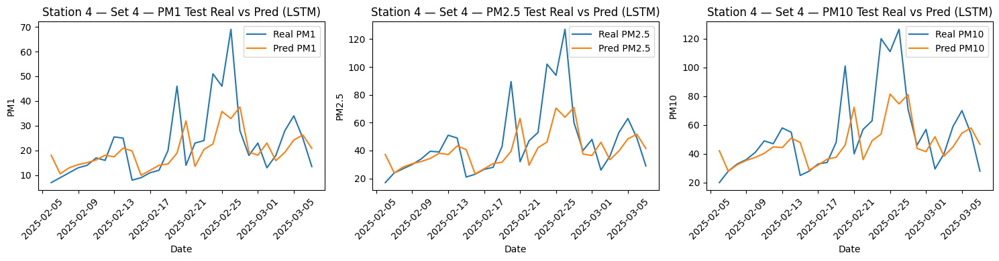

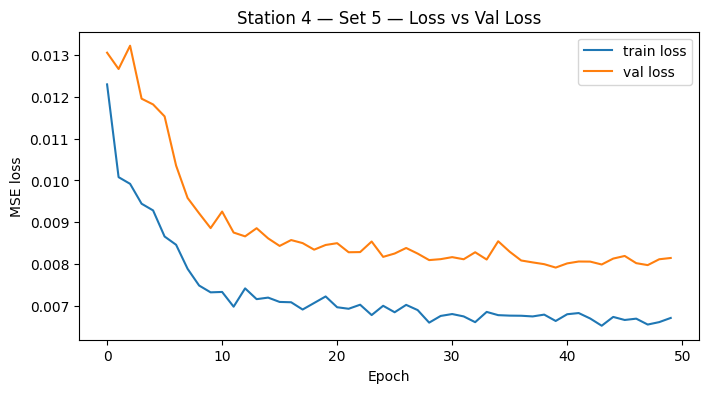

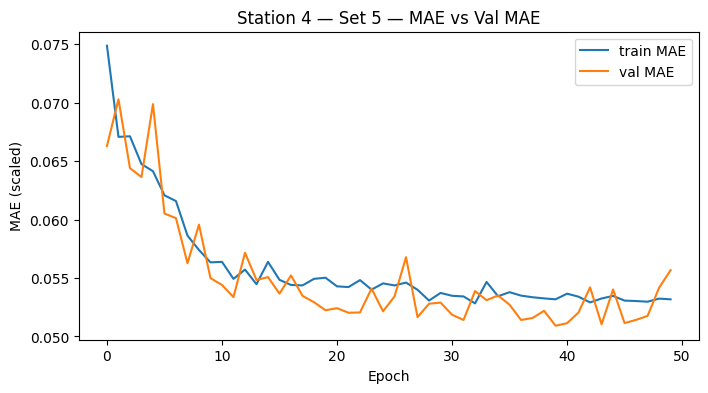

[4] [5] MAE TEST — PM1: 9.7161, PM2.5: 14.6870, PM10: 15.9670
[4] [5] MAE TRAIN — PM1: 3.5304, PM2.5: 6.1584, PM10: 6.3957


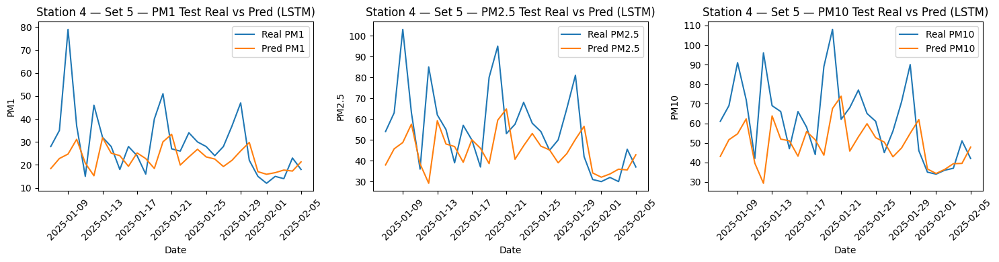


MAE on all stations and subsets (on TEST):
PM1: 2.8285
PM2.5: 4.1898
PM10: 4.7757


In [ ]:
all_stations_mae = []
lstm_models = {}

for station_id in range(1, 5):
    print(f"\n======== LSTM for Station {station_id} ========")
    mae_results, best_model, best_scaler, full_data, full_dates = train_and_evaluate_lstm(
        all_station_data[station_id],
        seq_length=10,
        station_id=station_id
    )
    all_stations_mae.extend(mae_results)
    lstm_models[station_id] = (best_model, best_scaler, full_data, full_dates)

if all_stations_mae:
    mean_pm1 = np.mean([r[0] for r in all_stations_mae])
    mean_pm25 = np.mean([r[1] for r in all_stations_mae])
    mean_pm10 = np.mean([r[2] for r in all_stations_mae])

    print("\nMAE on all stations and subsets (on TEST):")
    print(f"PM1: {mean_pm1:.4f}")
    print(f"PM2.5: {mean_pm25:.4f}")
    print(f"PM10: {mean_pm10:.4f}")
else:
    print("No results were obtained for calculating the MAE average.")

Enter the station number for which you want the prediction (1-4): 1


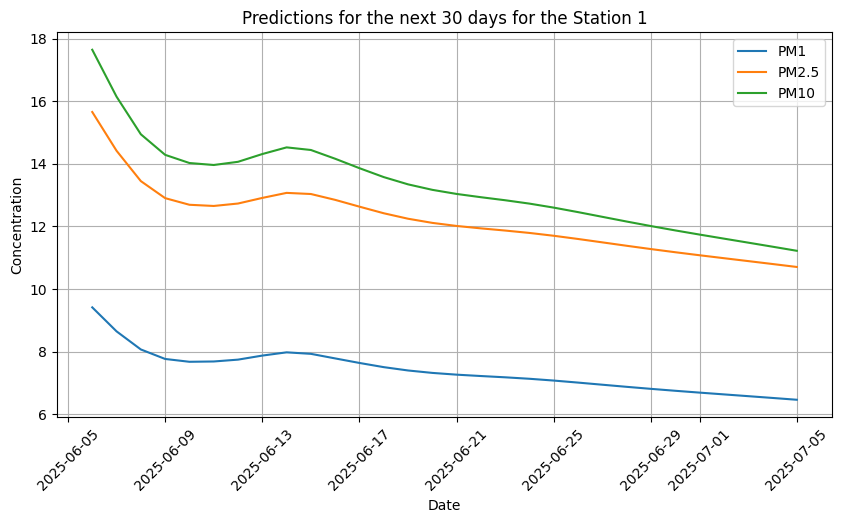

In [ ]:
station_input = int(input("Enter the station number for which you want the prediction (1-4): "))
assert station_input in [1, 2, 3, 4], "You must enter a number from 1 to 4."

model, scaler, full_data, full_dates = lstm_models[station_input]

seq_length = 10
recent_seq = full_data[-seq_length:]
scaled_recent_seq = scaler.transform(recent_seq)

predictions_scaled = []

current_seq = scaled_recent_seq.copy()
for _ in range(30):
    pred = model.predict(np.expand_dims(current_seq, axis=0), verbose=0)
    predictions_scaled.append(pred[0])
    current_seq = np.vstack([current_seq[1:], pred])

predictions = scaler.inverse_transform(predictions_scaled)

# Generate the actual dates for the next 30 days starting with the last date in full_dates
start_date = pd.to_datetime(full_dates[-1])
pred_dates = pd.date_range(start=start_date + pd.Timedelta(days=1), periods=30)

plt.figure(figsize=(10, 5))
plt.plot(pred_dates, predictions[:, 0], label='PM1')
plt.plot(pred_dates, predictions[:, 1], label='PM2.5')
plt.plot(pred_dates, predictions[:, 2], label='PM10')
plt.title(f'Predictions for the next 30 days for the Station {station_input}')
plt.xlabel('Date')
plt.ylabel('Concentration')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [ ]:
def train_and_evaluate_lr(dfs, seq_length=10, station_id=0):
    mae_results = []
    best_model = None

    for i in range(1, 6):
        df_temp = dfs[f'subset_{i}'].copy()

        if len(df_temp) <= seq_length + 30:
            print(f"[LR] [{station_id}] [{i}] Not enough data for training and testing.")
            continue

        features = df_temp[['PM1', 'PM2.5', 'PM10']].values
        dates = df_temp['date'].values
        train_data = features[:-30]
        test_data = features[-(30 + seq_length):]
        test_dates = df_temp['date'].values[-30:]

        scaler = MinMaxScaler()
        train_scaled = scaler.fit_transform(train_data)
        test_scaled = scaler.transform(test_data)

        # Sequences
        X_train, y_train = [], []
        for j in range(len(train_scaled) - seq_length):
            X_train.append(train_scaled[j:j+seq_length].flatten())
            y_train.append(train_scaled[j+seq_length])

        X_train, y_train = np.array(X_train), np.array(y_train)

        X_test, y_test = [], []
        for j in range(len(test_scaled) - seq_length):
            X_test.append(test_scaled[j:j+seq_length].flatten())
            y_test.append(test_scaled[j+seq_length])

        X_test, y_test = np.array(X_test), np.array(y_test)

        model = LinearRegression()
        model.fit(X_train, y_train)

        if i == 1:
            best_model = model
            best_scaler = scaler
            full_data = features
            full_dates = dates

        preds_train = model.predict(X_train)
        preds_test = model.predict(X_test)

        preds_train_inv = scaler.inverse_transform(preds_train)
        y_train_inv = scaler.inverse_transform(y_train)
        preds_test_inv = scaler.inverse_transform(preds_test)
        y_test_inv = scaler.inverse_transform(y_test)

        for split, y_true, preds in [
            ('TEST', y_test_inv, preds_test_inv),
            ('TRAIN', y_train_inv, preds_train_inv)
        ]:
            mae_pm1 = mean_absolute_error(y_true[:, 0], preds[:, 0])
            mae_pm25 = mean_absolute_error(y_true[:, 1], preds[:, 1])
            mae_pm10 = mean_absolute_error(y_true[:, 2], preds[:, 2])
            print(f"[LR] [{station_id}] [{i}] MAE {split} — PM1: {mae_pm1:.4f}, PM2.5: {mae_pm25:.4f}, PM10: {mae_pm10:.4f}")

            if split == 'TEST':
                mae_results.append([mae_pm1, mae_pm25, mae_pm10])

        # TEST Plot
        plt.figure(figsize=(15, 4))

        plt.subplot(1, 3, 1)
        plt.plot(test_dates, y_test_inv[:, 0], label='Real PM1')
        plt.plot(test_dates, preds_test_inv[:, 0], label='Pred PM1')
        plt.title(f'Station {station_id} — Set {i} — PM1 Test Real vs Pred (LR)')
        plt.xlabel('Date')
        plt.ylabel('PM1')
        plt.legend()
        plt.xticks(rotation=45)

        plt.subplot(1, 3, 2)
        plt.plot(test_dates, y_test_inv[:, 1], label='Real PM2.5')
        plt.plot(test_dates, preds_test_inv[:, 1], label='Pred PM2.5')
        plt.title(f'Station {station_id} — Set {i} — PM2.5 Test Real vs Pred (LR)')
        plt.xlabel('Date')
        plt.ylabel('PM2.5')
        plt.legend()
        plt.xticks(rotation=45)

        plt.subplot(1, 3, 3)
        plt.plot(test_dates, y_test_inv[:, 2], label='Real PM10')
        plt.plot(test_dates, preds_test_inv[:, 2], label='Pred PM10')
        plt.title(f'Station {station_id} — Set {i} — PM10 Test Real vs Pred (LR)')
        plt.xlabel('Date')
        plt.ylabel('PM10')
        plt.legend()
        plt.xticks(rotation=45)

        plt.tight_layout()
        plt.show()

    return mae_results, best_model, best_scaler, full_data, full_dates


======== Linear Regression for Station 1 ========
[LR] [1] [1] MAE TEST — PM1: 2.1200, PM2.5: 3.2615, PM10: 3.7904
[LR] [1] [1] MAE TRAIN — PM1: 2.7082, PM2.5: 4.2847, PM10: 5.2500


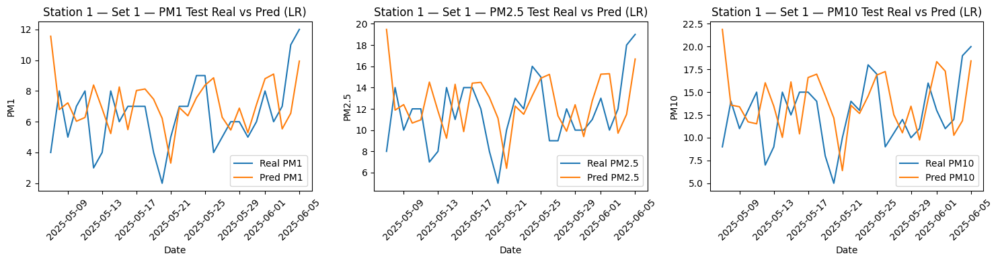

[LR] [1] [2] MAE TEST — PM1: 2.1441, PM2.5: 3.2254, PM10: 3.8374
[LR] [1] [2] MAE TRAIN — PM1: 2.7317, PM2.5: 4.3289, PM10: 5.3110


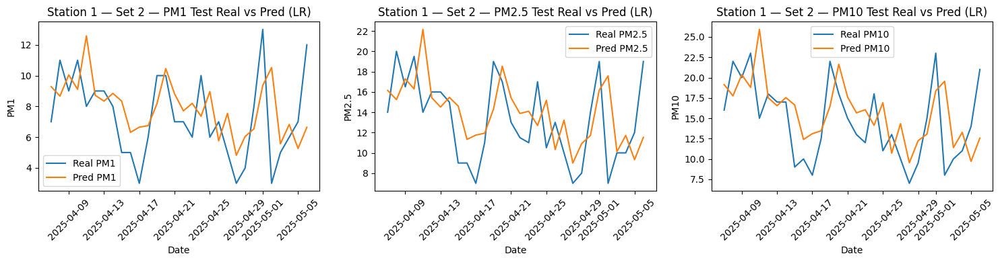

[LR] [1] [3] MAE TEST — PM1: 3.4903, PM2.5: 5.7197, PM10: 7.1104
[LR] [1] [3] MAE TRAIN — PM1: 2.7128, PM2.5: 4.2929, PM10: 5.2628


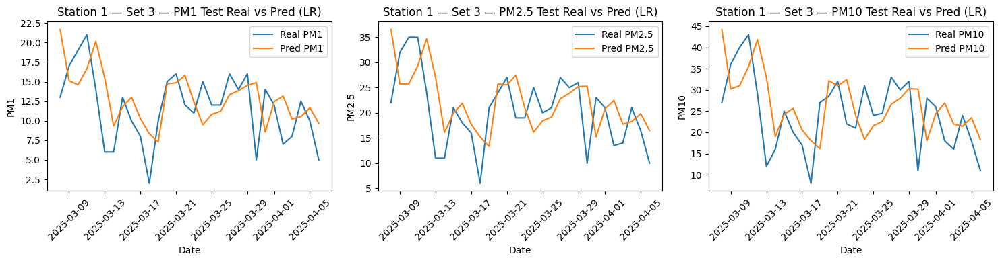

[LR] [1] [4] MAE TEST — PM1: 5.1956, PM2.5: 8.7993, PM10: 11.0071
[LR] [1] [4] MAE TRAIN — PM1: 2.6156, PM2.5: 4.1181, PM10: 5.0328


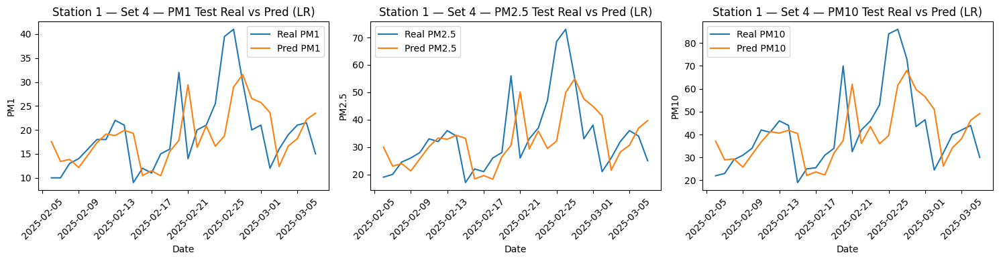

[LR] [1] [5] MAE TEST — PM1: 5.0875, PM2.5: 8.9440, PM10: 10.3357
[LR] [1] [5] MAE TRAIN — PM1: 2.5226, PM2.5: 3.9239, PM10: 4.8168


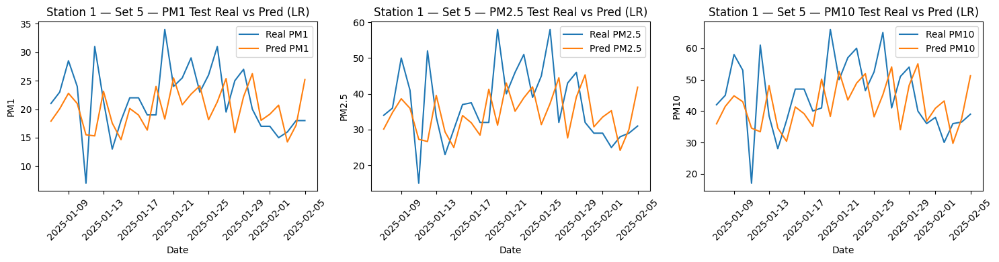


======== Linear Regression for Station 2 ========
[LR] [2] [1] MAE TEST — PM1: 0.6370, PM2.5: 0.8903, PM10: 0.8342
[LR] [2] [1] MAE TRAIN — PM1: 1.8275, PM2.5: 2.2409, PM10: 2.4362


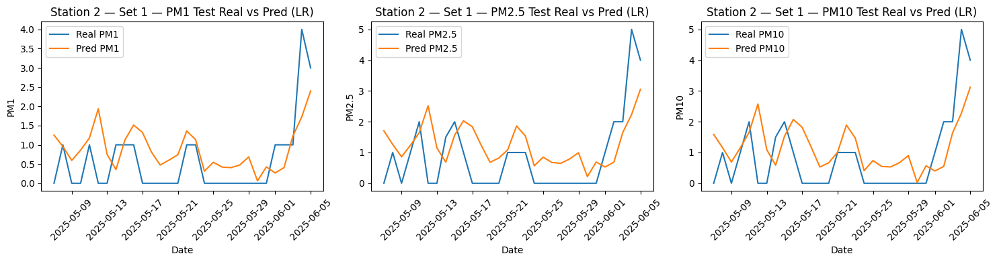

[LR] [2] [2] MAE TEST — PM1: 0.8914, PM2.5: 0.9364, PM10: 0.9525
[LR] [2] [2] MAE TRAIN — PM1: 1.8710, PM2.5: 2.3004, PM10: 2.5033


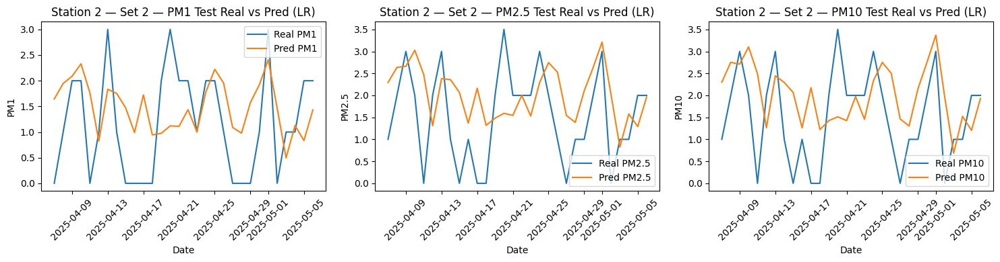

[LR] [2] [3] MAE TEST — PM1: 1.9462, PM2.5: 2.4314, PM10: 2.6509
[LR] [2] [3] MAE TRAIN — PM1: 1.8773, PM2.5: 2.3082, PM10: 2.5108


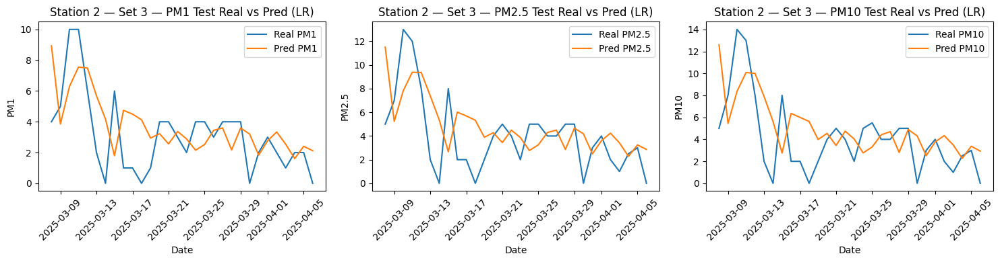

[LR] [2] [4] MAE TEST — PM1: 2.8703, PM2.5: 3.5410, PM10: 3.9632
[LR] [2] [4] MAE TRAIN — PM1: 1.8370, PM2.5: 2.2498, PM10: 2.4467


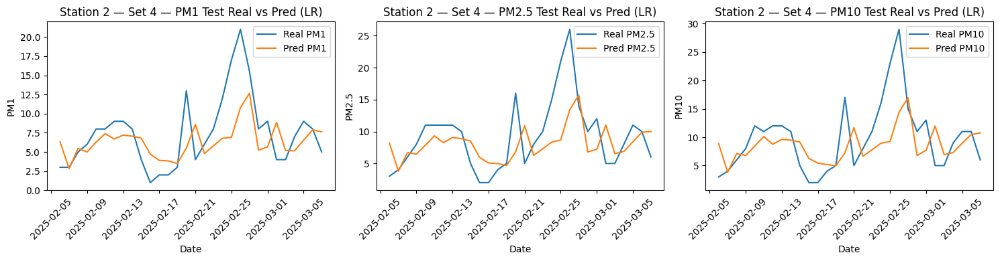

[LR] [2] [5] MAE TEST — PM1: 4.0872, PM2.5: 5.0805, PM10: 5.5890
[LR] [2] [5] MAE TRAIN — PM1: 1.7398, PM2.5: 2.1274, PM10: 2.2993


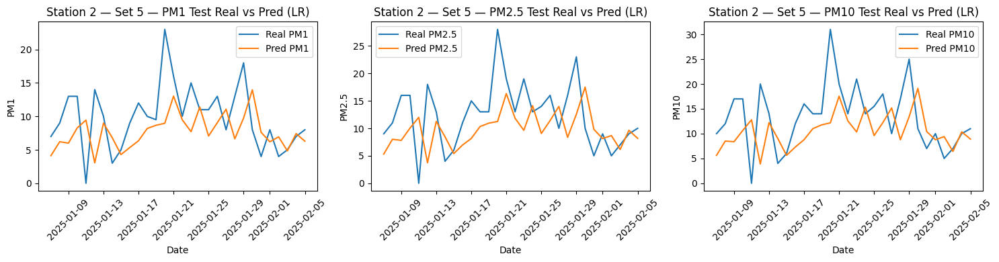


======== Linear Regression for Station 3 ========
[LR] [3] [1] MAE TEST — PM1: 1.1302, PM2.5: 1.5706, PM10: 1.6808
[LR] [3] [1] MAE TRAIN — PM1: 3.2430, PM2.5: 4.0693, PM10: 4.6836


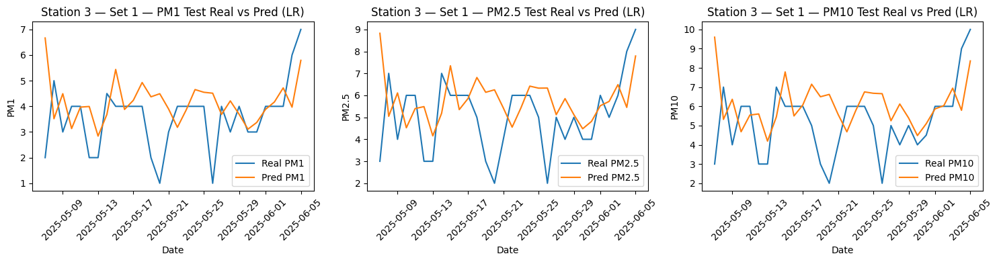

[LR] [3] [2] MAE TEST — PM1: 1.7195, PM2.5: 2.1492, PM10: 2.5265
[LR] [3] [2] MAE TRAIN — PM1: 3.2880, PM2.5: 4.1264, PM10: 4.7484


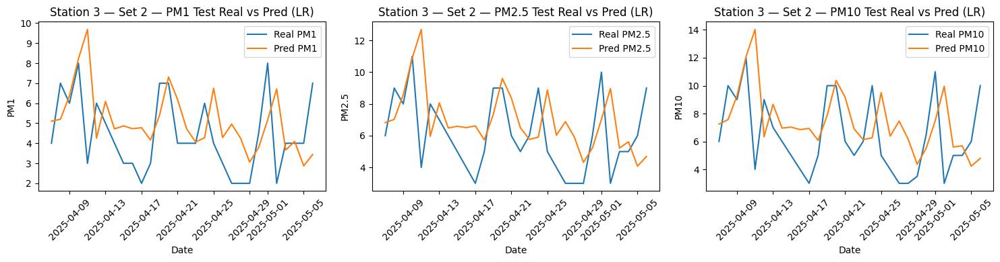

[LR] [3] [3] MAE TEST — PM1: 3.6827, PM2.5: 4.5623, PM10: 5.2142
[LR] [3] [3] MAE TRAIN — PM1: 3.2915, PM2.5: 4.1321, PM10: 4.7569


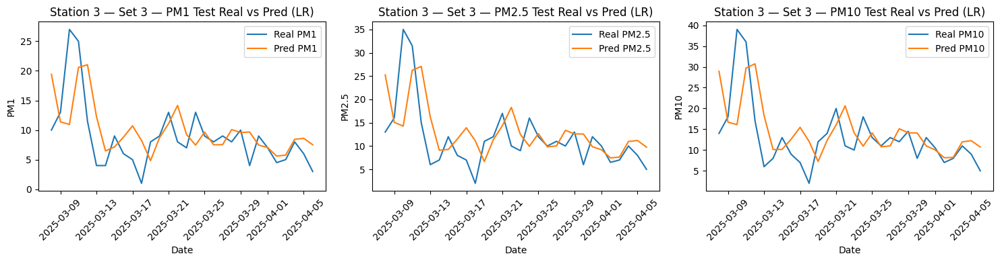

[LR] [3] [4] MAE TEST — PM1: 7.6225, PM2.5: 9.3322, PM10: 10.8942
[LR] [3] [4] MAE TRAIN — PM1: 3.1775, PM2.5: 3.9933, PM10: 4.5901


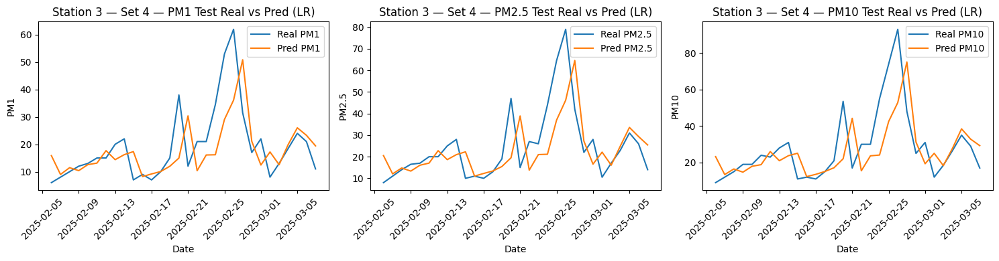

[LR] [3] [5] MAE TEST — PM1: 6.6026, PM2.5: 8.1202, PM10: 8.9325
[LR] [3] [5] MAE TRAIN — PM1: 3.1047, PM2.5: 3.8937, PM10: 4.4927


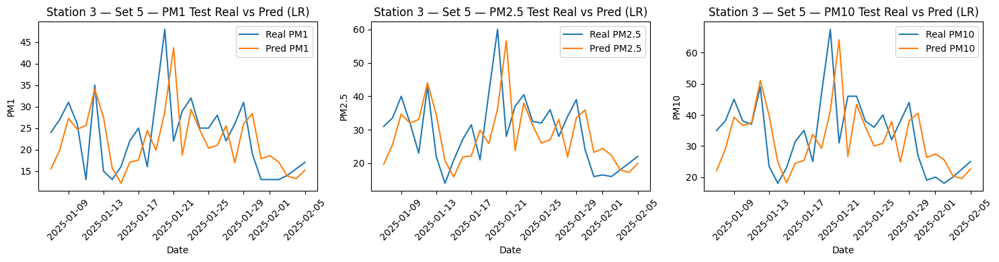


======== Linear Regression for Station 4 ========
[LR] [4] [1] MAE TEST — PM1: 1.5793, PM2.5: 2.6683, PM10: 2.8176
[LR] [4] [1] MAE TRAIN — PM1: 3.4663, PM2.5: 5.8643, PM10: 6.3041


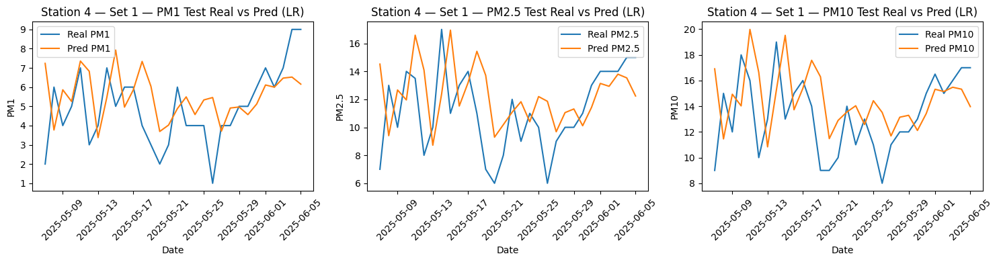

[LR] [4] [2] MAE TEST — PM1: 2.3351, PM2.5: 3.8956, PM10: 4.0709
[LR] [4] [2] MAE TRAIN — PM1: 3.4872, PM2.5: 5.9000, PM10: 6.3437


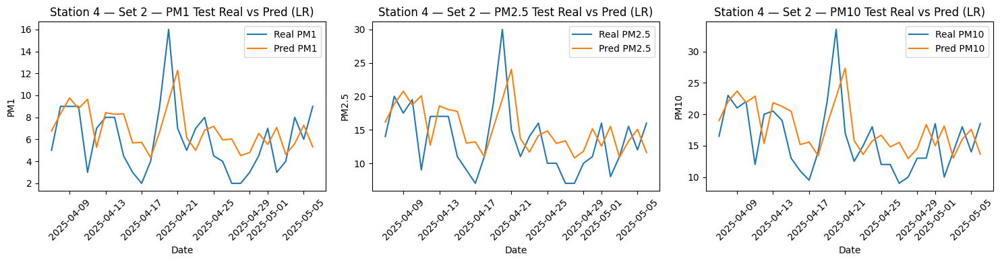

[LR] [4] [3] MAE TEST — PM1: 4.7924, PM2.5: 7.9995, PM10: 8.7598
[LR] [4] [3] MAE TRAIN — PM1: 3.4694, PM2.5: 5.8687, PM10: 6.3059


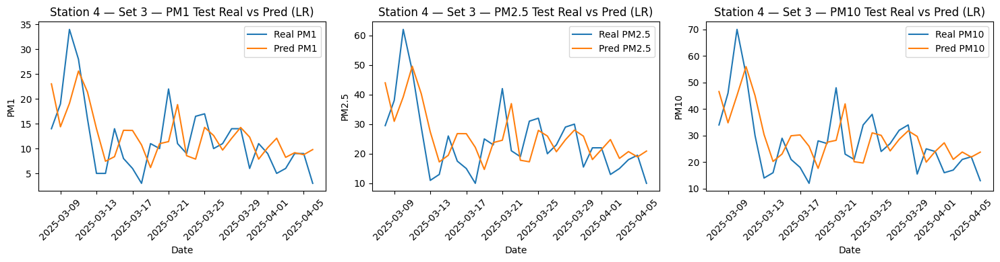

[LR] [4] [4] MAE TEST — PM1: 8.0129, PM2.5: 13.8521, PM10: 14.6091
[LR] [4] [4] MAE TRAIN — PM1: 3.3822, PM2.5: 5.7151, PM10: 6.1537


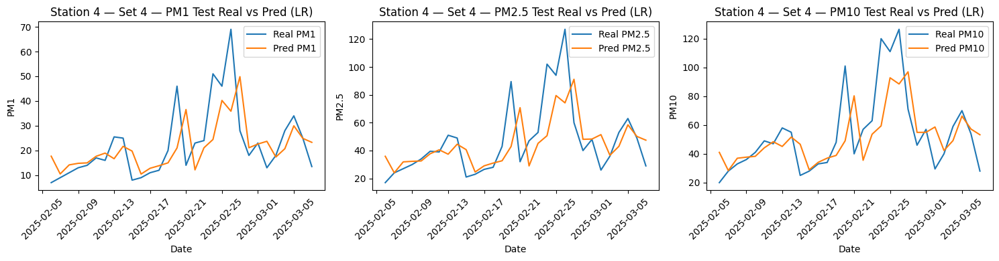

[LR] [4] [5] MAE TEST — PM1: 9.6420, PM2.5: 15.2363, PM10: 16.6002
[LR] [4] [5] MAE TRAIN — PM1: 3.2671, PM2.5: 5.5580, PM10: 5.9979


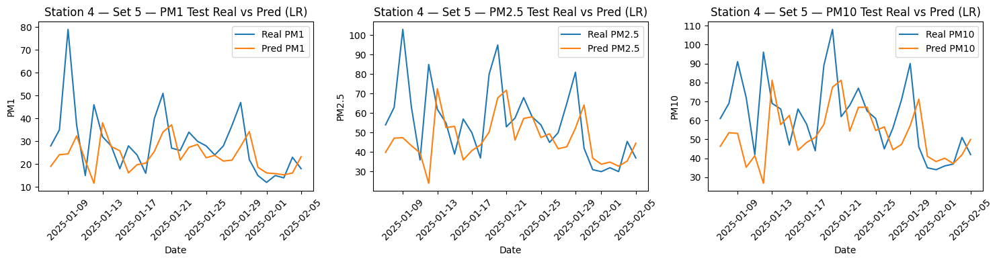


MAE on all stations and subsets (on TEST):
PM1: 3.7794
PM2.5: 5.6108
PM10: 6.3088


In [ ]:
all_stations_mae_lr = []
lr_models = {}

for station_id in range(1, 5):
    print(f"\n======== Linear Regression for Station {station_id} ========")
    mae_results, best_model, best_scaler, full_data, full_dates = train_and_evaluate_lr(
        all_station_data[station_id],
        seq_length=10,
        station_id=station_id
    )
    all_stations_mae_lr.extend(mae_results)
    lr_models[station_id] = (best_model, best_scaler, full_data, full_dates)

if all_stations_mae_lr:
    mean_pm1 = np.mean([r[0] for r in all_stations_mae_lr])
    mean_pm25 = np.mean([r[1] for r in all_stations_mae_lr])
    mean_pm10 = np.mean([r[2] for r in all_stations_mae_lr])

    print("\nMAE on all stations and subsets (on TEST):")
    print(f"PM1: {mean_pm1:.4f}")
    print(f"PM2.5: {mean_pm25:.4f}")
    print(f"PM10: {mean_pm10:.4f}")
else:
    print("No results were obtained for calculating the MAE average.")

Enter the station number for which you want the prediction (1-4): 4


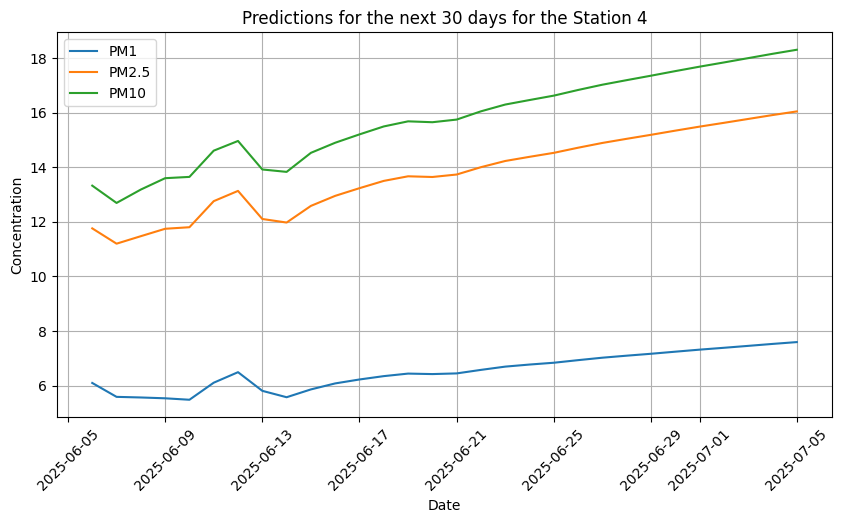

In [ ]:
station_input = int(input("Enter the station number for which you want the prediction (1-4): "))
assert station_input in [1, 2, 3, 4], "You must enter a number from 1 to 4."

model, scaler, full_data, full_dates = lr_models[station_input]

seq_length = 10
recent_seq = full_data[-seq_length:]
scaled_recent_seq = scaler.transform(recent_seq)

predictions_scaled = []
current_seq = scaled_recent_seq.copy()

for _ in range(30):
    X_input = current_seq.flatten().reshape(1, -1)
    pred = model.predict(X_input)
    predictions_scaled.append(pred[0])
    current_seq = np.vstack([current_seq[1:], pred])

predictions = scaler.inverse_transform(predictions_scaled)

# Generate the actual dates for the next 30 days starting with the last date in full_dates
start_date = pd.to_datetime(full_dates[-1])
pred_dates = pd.date_range(start=start_date + pd.Timedelta(days=1), periods=30)

plt.figure(figsize=(10, 5))
plt.plot(pred_dates, predictions[:, 0], label='PM1')
plt.plot(pred_dates, predictions[:, 1], label='PM2.5')
plt.plot(pred_dates, predictions[:, 2], label='PM10')
plt.title(f'Predictions for the next 30 days for the Station {station_input}')
plt.xlabel('Date')
plt.ylabel('Concentration')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [ ]:
def train_and_evaluate_rf(dfs, seq_length=10, station_id=0):
    mae_results = []
    best_model = None

    for i in range(1, 6):
        df_temp = dfs[f'subset_{i}'].copy()

        if len(df_temp) <= seq_length + 30:
            print(f"[{station_id}] [{i}] Not enough data for training and testing.")
            continue

        features = df_temp[['PM1', 'PM2.5', 'PM10']].values
        dates = df_temp['date'].values
        train_data = features[:-30]
        test_data = features[-(30 + seq_length):]
        test_dates = dates[-30:]

        scaler = MinMaxScaler()
        train_scaled = scaler.fit_transform(train_data)
        test_scaled = scaler.transform(test_data)

        X_train, y_train = [], []
        for j in range(len(train_scaled) - seq_length):
            X_train.append(train_scaled[j:j+seq_length].flatten())
            y_train.append(train_scaled[j+seq_length])
        X_train, y_train = np.array(X_train), np.array(y_train)

        X_test, y_test = [], []
        for j in range(len(test_scaled) - seq_length):
            X_test.append(test_scaled[j:j+seq_length].flatten())
            y_test.append(test_scaled[j+seq_length])
        X_test, y_test = np.array(X_test), np.array(y_test)

        model = RandomForestRegressor(n_estimators=1000, random_state=42)
        model.fit(X_train, y_train)

        if i == 1:
            best_model = model
            best_scaler = scaler
            full_data = features
            full_dates = dates

        preds_train = model.predict(X_train)
        preds_test = model.predict(X_test)

        preds_train_inv = scaler.inverse_transform(preds_train)
        y_train_inv = scaler.inverse_transform(y_train)

        preds_test_inv = scaler.inverse_transform(preds_test)
        y_test_inv = scaler.inverse_transform(y_test)

        for split, y_true, preds in [
            ('TEST', y_test_inv, preds_test_inv),
            ('TRAIN', y_train_inv, preds_train_inv)
        ]:
            mae_pm1 = mean_absolute_error(y_true[:, 0], preds[:, 0])
            mae_pm25 = mean_absolute_error(y_true[:, 1], preds[:, 1])
            mae_pm10 = mean_absolute_error(y_true[:, 2], preds[:, 2])
            print(f"[{station_id}] [{i}] MAE {split} — PM1: {mae_pm1:.4f}, PM2.5: {mae_pm25:.4f}, PM10: {mae_pm10:.4f}")

            if split == 'TEST':
                mae_results.append([mae_pm1, mae_pm25, mae_pm10])

        # Plot TEST: pred vs real cu date pe axa X
        plt.figure(figsize=(15, 4))

        plt.subplot(1, 3, 1)
        plt.plot(test_dates, y_test_inv[:, 0], label='Real PM1')
        plt.plot(test_dates, preds_test_inv[:, 0], label='Pred PM1')
        plt.title(f'Station {station_id} — Set {i} — PM1 Test Real vs Pred (RFR)')
        plt.xlabel('Date')
        plt.ylabel('PM1')
        plt.legend()
        plt.xticks(rotation=45)

        plt.subplot(1, 3, 2)
        plt.plot(test_dates, y_test_inv[:, 1], label='Real PM2.5')
        plt.plot(test_dates, preds_test_inv[:, 1], label='Pred PM2.5')
        plt.title(f'Station {station_id} — Set {i} — PM2.5 Test Real vs Pred (RFR)')
        plt.xlabel('Date')
        plt.ylabel('PM2.5')
        plt.legend()
        plt.xticks(rotation=45)

        plt.subplot(1, 3, 3)
        plt.plot(test_dates, y_test_inv[:, 2], label='Real PM10')
        plt.plot(test_dates, preds_test_inv[:, 2], label='Pred PM10')
        plt.title(f'Station {station_id} — Set {i} — PM10 Test Real vs Pred (RFR)')
        plt.xlabel('Date')
        plt.ylabel('PM10')
        plt.legend()
        plt.xticks(rotation=45)

        plt.tight_layout()
        plt.show()

    return mae_results, best_model, best_scaler, full_data, full_dates


======== Random Forest for Station 1 ========
[1] [1] MAE TEST — PM1: 1.6552, PM2.5: 2.6129, PM10: 2.9092
[1] [1] MAE TRAIN — PM1: 1.0713, PM2.5: 1.6919, PM10: 2.0701


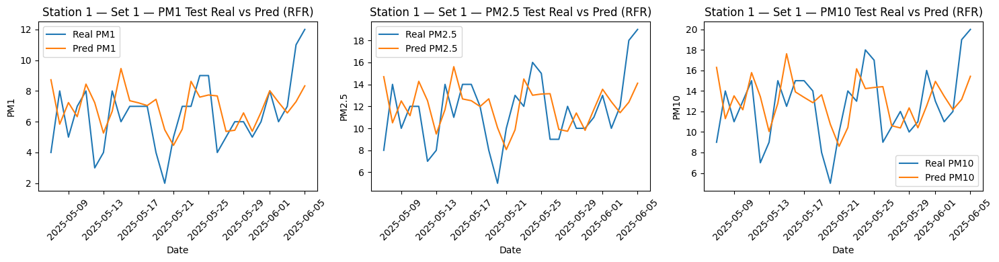

[1] [2] MAE TEST — PM1: 2.0875, PM2.5: 2.9849, PM10: 3.5197
[1] [2] MAE TRAIN — PM1: 1.0852, PM2.5: 1.7173, PM10: 2.1037


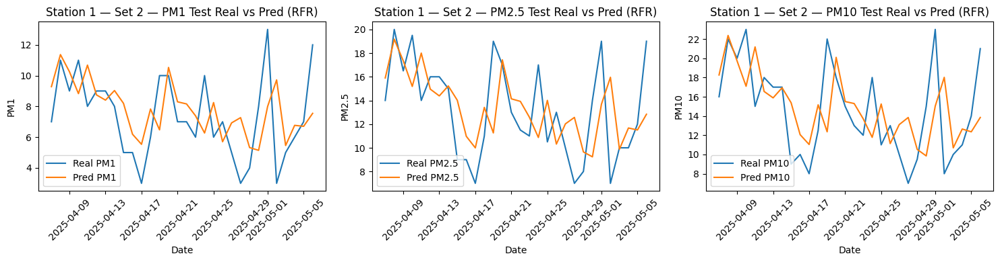

[1] [3] MAE TEST — PM1: 3.7629, PM2.5: 6.1398, PM10: 7.5327
[1] [3] MAE TRAIN — PM1: 1.0713, PM2.5: 1.6917, PM10: 2.0747


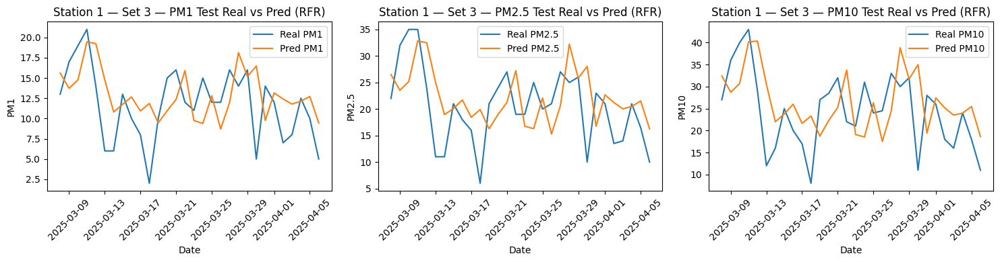

[1] [4] MAE TEST — PM1: 5.4660, PM2.5: 9.7253, PM10: 11.8352
[1] [4] MAE TRAIN — PM1: 1.0410, PM2.5: 1.6226, PM10: 1.9866


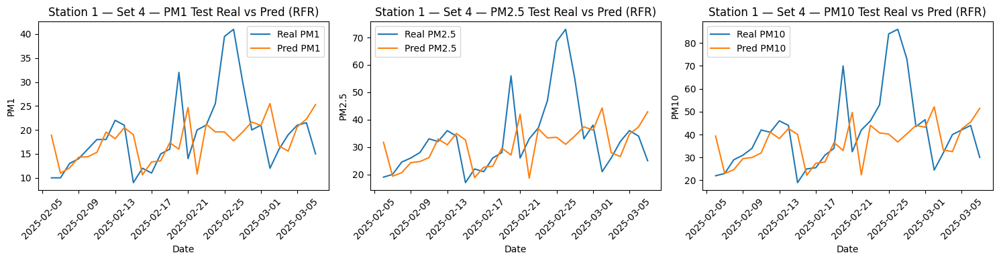

[1] [5] MAE TEST — PM1: 5.5335, PM2.5: 9.4683, PM10: 11.3040
[1] [5] MAE TRAIN — PM1: 1.0002, PM2.5: 1.5545, PM10: 1.9053


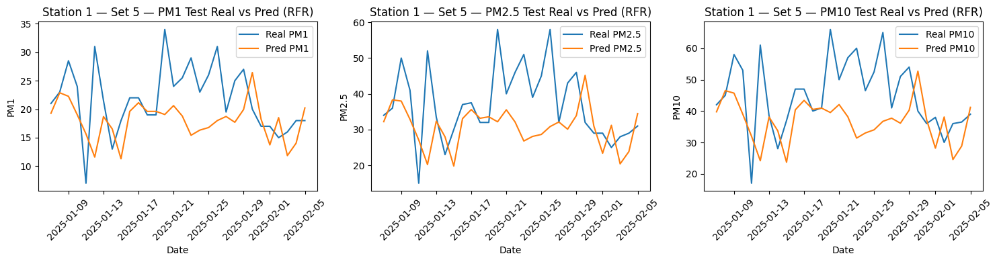


======== Random Forest for Station 2 ========
[2] [1] MAE TEST — PM1: 0.6448, PM2.5: 0.8362, PM10: 0.8408
[2] [1] MAE TRAIN — PM1: 0.6969, PM2.5: 0.8480, PM10: 0.9167


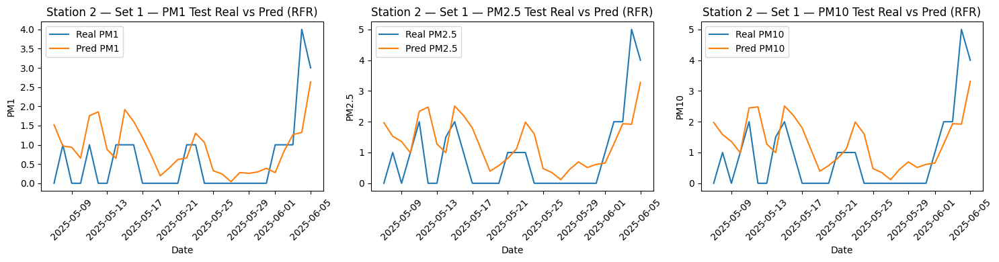

[2] [2] MAE TEST — PM1: 1.0601, PM2.5: 1.1573, PM10: 1.1868
[2] [2] MAE TRAIN — PM1: 0.7140, PM2.5: 0.8707, PM10: 0.9424


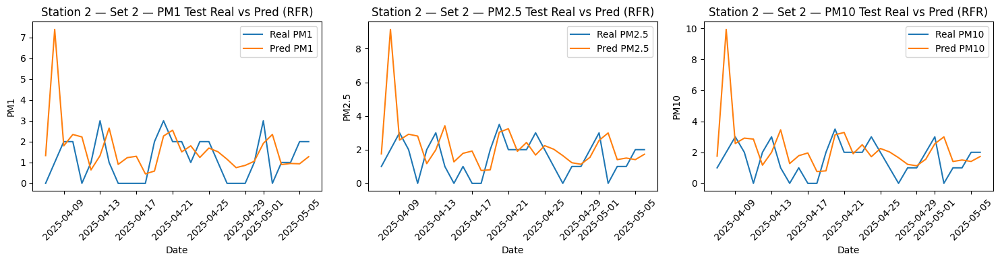

[2] [3] MAE TEST — PM1: 1.7677, PM2.5: 2.1883, PM10: 2.3686
[2] [3] MAE TRAIN — PM1: 0.7261, PM2.5: 0.8842, PM10: 0.9574


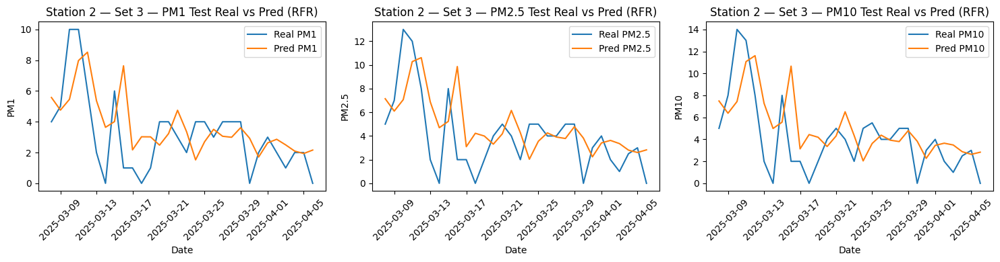

[2] [4] MAE TEST — PM1: 3.0719, PM2.5: 3.7040, PM10: 4.1408
[2] [4] MAE TRAIN — PM1: 0.7065, PM2.5: 0.8589, PM10: 0.9269


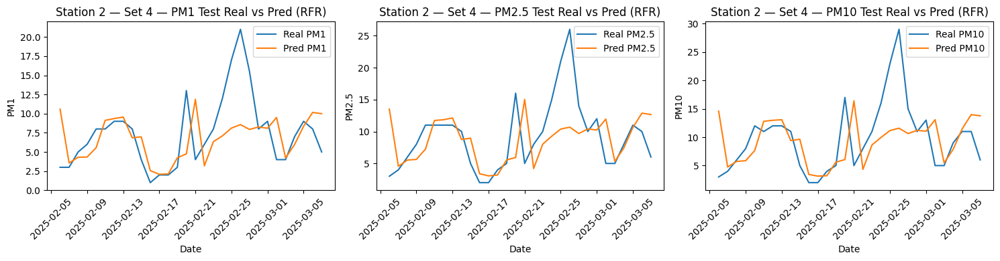

[2] [5] MAE TEST — PM1: 4.1144, PM2.5: 5.0792, PM10: 5.4935
[2] [5] MAE TRAIN — PM1: 0.6693, PM2.5: 0.8090, PM10: 0.8721


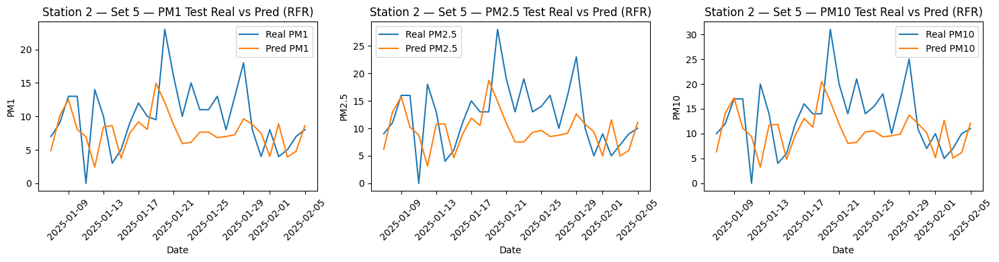


======== Random Forest for Station 3 ========
[3] [1] MAE TEST — PM1: 1.2829, PM2.5: 1.7308, PM10: 1.8428
[3] [1] MAE TRAIN — PM1: 1.2589, PM2.5: 1.5724, PM10: 1.8094


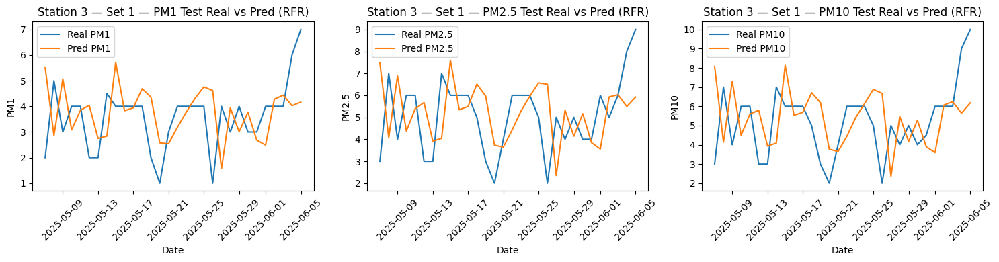

[3] [2] MAE TEST — PM1: 1.5601, PM2.5: 1.9241, PM10: 2.2990
[3] [2] MAE TRAIN — PM1: 1.2779, PM2.5: 1.5936, PM10: 1.8349


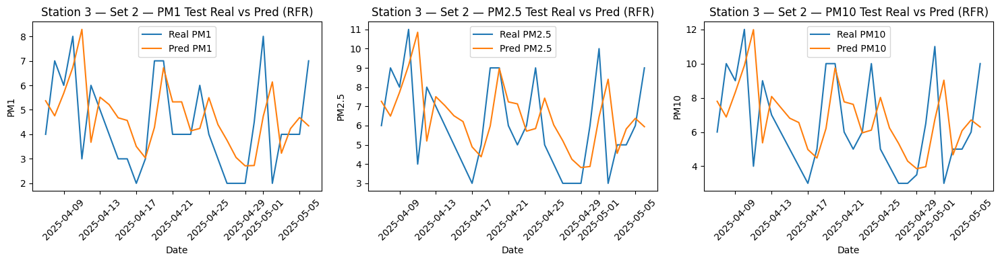

[3] [3] MAE TEST — PM1: 3.7818, PM2.5: 4.6376, PM10: 5.2986
[3] [3] MAE TRAIN — PM1: 1.2800, PM2.5: 1.5969, PM10: 1.8392


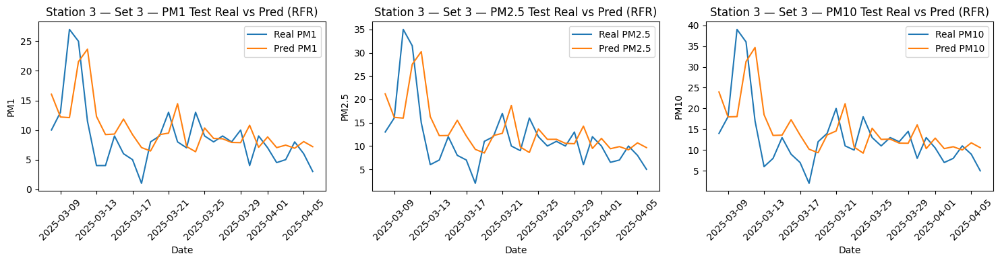

[3] [4] MAE TEST — PM1: 8.0041, PM2.5: 9.6824, PM10: 11.3306
[3] [4] MAE TRAIN — PM1: 1.2335, PM2.5: 1.5442, PM10: 1.7754


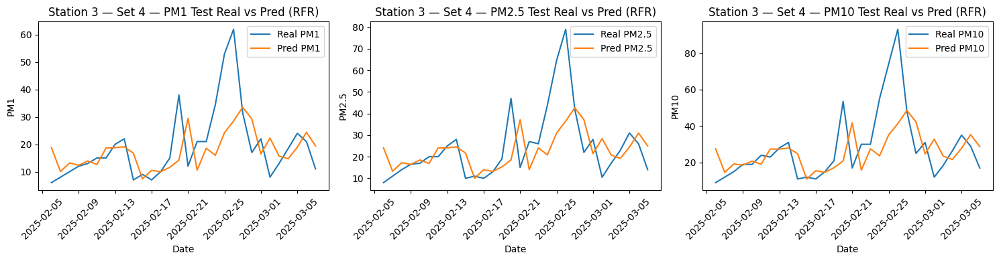

[3] [5] MAE TEST — PM1: 6.2736, PM2.5: 7.6251, PM10: 8.5457
[3] [5] MAE TRAIN — PM1: 1.2067, PM2.5: 1.5125, PM10: 1.7428


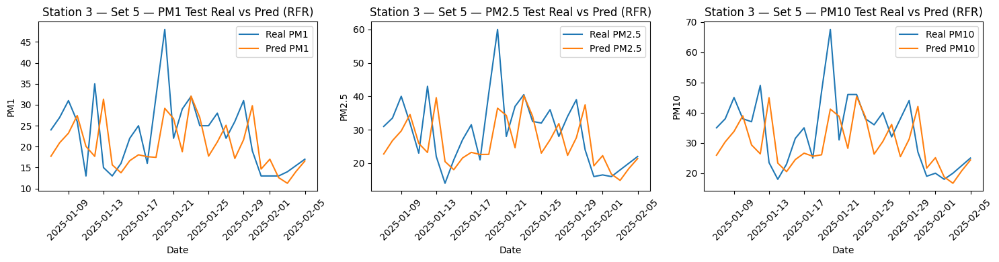


======== Random Forest for Station 4 ========
[4] [1] MAE TEST — PM1: 1.5214, PM2.5: 2.2626, PM10: 2.3290
[4] [1] MAE TRAIN — PM1: 1.3588, PM2.5: 2.2935, PM10: 2.4741


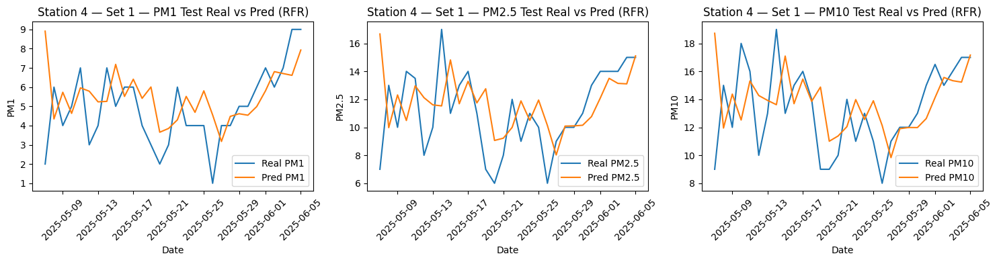

[4] [2] MAE TEST — PM1: 2.3967, PM2.5: 4.1538, PM10: 4.4766
[4] [2] MAE TRAIN — PM1: 1.3615, PM2.5: 2.2980, PM10: 2.4785


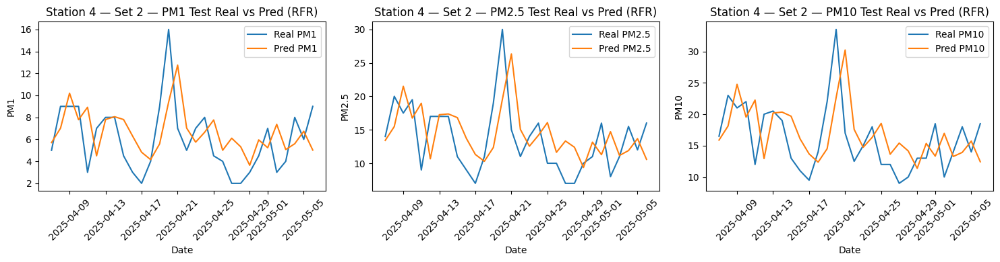

[4] [3] MAE TEST — PM1: 4.5933, PM2.5: 8.2707, PM10: 9.5266
[4] [3] MAE TRAIN — PM1: 1.3560, PM2.5: 2.2834, PM10: 2.4597


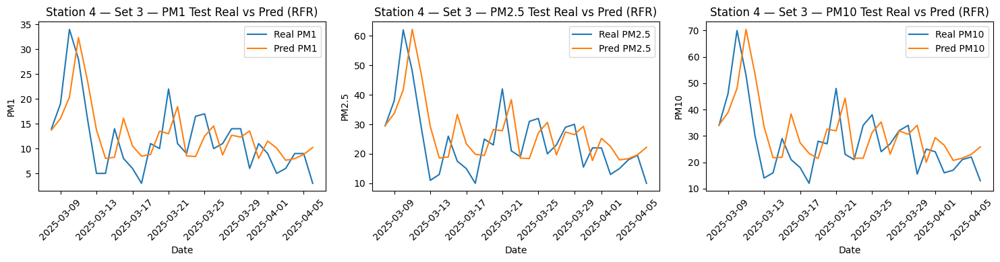

[4] [4] MAE TEST — PM1: 8.5317, PM2.5: 14.5576, PM10: 15.9384
[4] [4] MAE TRAIN — PM1: 1.3206, PM2.5: 2.2283, PM10: 2.3996


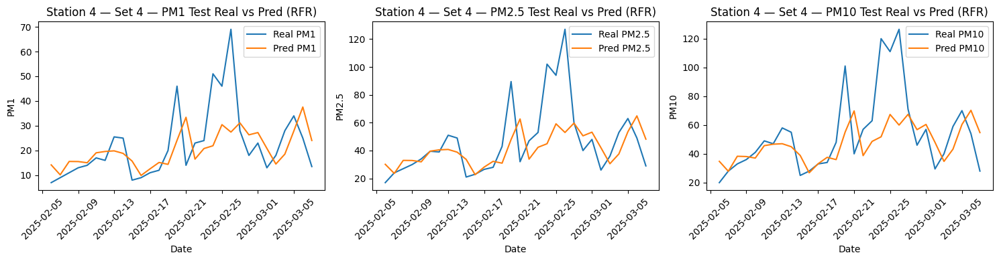

[4] [5] MAE TEST — PM1: 10.0231, PM2.5: 15.9282, PM10: 16.9263
[4] [5] MAE TRAIN — PM1: 1.2767, PM2.5: 2.1660, PM10: 2.3430


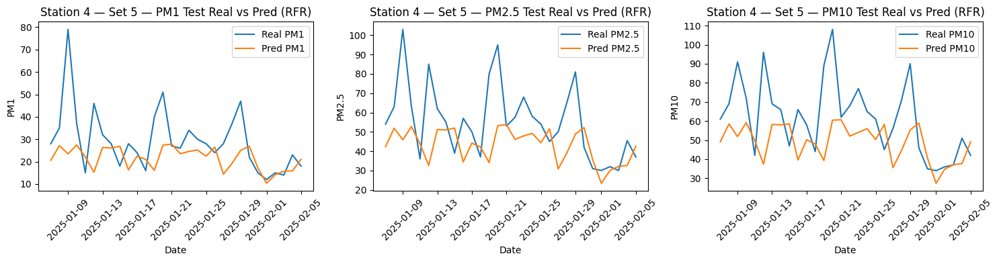


MAE on all stations and subsets (on TEST):
PM1: 3.8566
PM2.5: 5.7334
PM10: 6.4823


In [ ]:
rf_models = {}
all_stations_rf_mae = []

for station_id in range(1, 5):
    print(f"\n======== Random Forest for Station {station_id} ========")
    mae_results, best_model, best_scaler, full_data, full_dates = train_and_evaluate_rf(
        all_station_data[station_id],
        seq_length=10,
        station_id=station_id
    )
    all_stations_rf_mae.extend(mae_results)
    rf_models[station_id] = (best_model, best_scaler, full_data, full_dates)

# Media MAE pe toate stațiile
if all_stations_rf_mae:
    mean_pm1 = np.mean([r[0] for r in all_stations_rf_mae])
    mean_pm25 = np.mean([r[1] for r in all_stations_rf_mae])
    mean_pm10 = np.mean([r[2] for r in all_stations_rf_mae])

    print("\nMAE on all stations and subsets (on TEST):")
    print(f"PM1: {mean_pm1:.4f}")
    print(f"PM2.5: {mean_pm25:.4f}")
    print(f"PM10: {mean_pm10:.4f}")
else:
    print("No results were obtained for calculating the MAE average.")

Enter the station number for which you want the prediction (1-4): 1


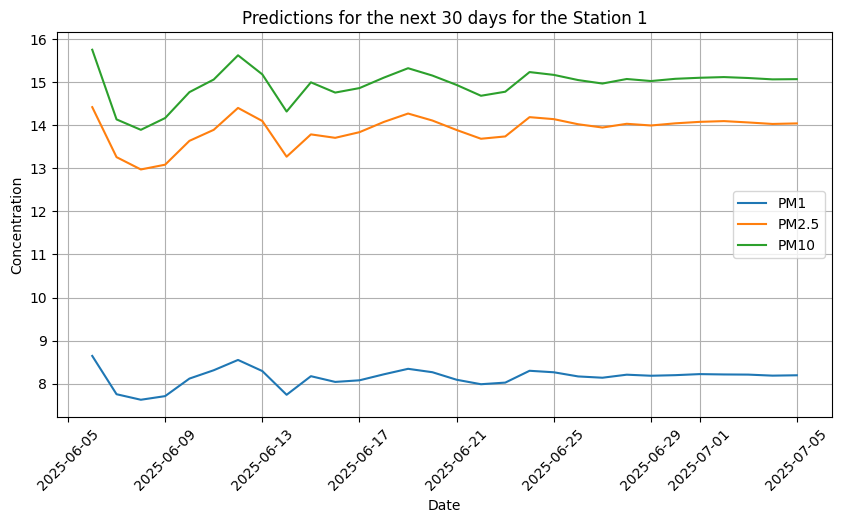

In [ ]:
station_input = int(input("Enter the station number for which you want the prediction (1-4): "))
assert station_input in [1, 2, 3, 4], "You must enter a number from 1 to 4."

model, scaler, full_data, full_dates = rf_models[station_input]

seq_length = 10
recent_seq = full_data[-seq_length:]
scaled_recent_seq = scaler.transform(recent_seq)

predictions_scaled = []

current_seq = scaled_recent_seq.copy()
for _ in range(30):
    current_seq_rf = current_seq.reshape((1, -1))
    pred = model.predict(current_seq_rf)
    predictions_scaled.append(pred[0])
    current_seq = np.vstack([current_seq[1:], pred])

predictions = scaler.inverse_transform(predictions_scaled)

# Generez datele pentru următoarele 30 de zile
start_date = pd.to_datetime(full_dates[-1])
pred_dates = pd.date_range(start=start_date + pd.Timedelta(days=1), periods=30)

plt.figure(figsize=(10, 5))
plt.plot(pred_dates, predictions[:, 0], label='PM1')
plt.plot(pred_dates, predictions[:, 1], label='PM2.5')
plt.plot(pred_dates, predictions[:, 2], label='PM10')
plt.title(f'Predictions for the next 30 days for the Station {station_input}')
plt.xlabel('Date')
plt.ylabel('Concentration')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [ ]:
def train_and_evaluate_svr(dfs, seq_length=10, station_id=0):
    mae_results = []
    best_model = None

    for i in range(1, 6):
        df_temp = dfs[f'subset_{i}'].copy()
        if len(df_temp) <= seq_length + 30:
            print(f"[{station_id}] [{i}] Not enough data for training and testing.")
            continue

        features = df_temp[['PM1','PM2.5','PM10']].values
        dates = df_temp['date'].values
        train_data = features[:-30]
        test_data = features[-(30+seq_length):]
        test_dates = dates[-30:]

        scaler = MinMaxScaler()
        train_scaled = scaler.fit_transform(train_data)
        test_scaled = scaler.transform(test_data)

        X_train, y_train = [], []
        for j in range(len(train_scaled)-seq_length):
            X_train.append(train_scaled[j:j+seq_length].flatten())
            y_train.append(train_scaled[j+seq_length])
        X_train, y_train = np.array(X_train), np.array(y_train)

        X_test, y_test = [], []
        for j in range(len(test_scaled)-seq_length):
            X_test.append(test_scaled[j:j+seq_length].flatten())
            y_test.append(test_scaled[j+seq_length])
        X_test, y_test = np.array(X_test), np.array(y_test)

        # Build multi-output SVR by wrapping
        model_pm1 = SVR(C=1, epsilon=0.01)
        model_pm25 = SVR(C=1, epsilon=0.01)
        model_pm10 = SVR(C=1, epsilon=0.01)

        model_pm1.fit(X_train, y_train[:,0])
        model_pm25.fit(X_train, y_train[:,1])
        model_pm10.fit(X_train, y_train[:,2])

        if i == 1:
            best_model = (model_pm1, model_pm25, model_pm10)
            best_scaler = scaler
            full_data = features
            full_dates = dates

        # Predict
        preds_train = np.column_stack((
            model_pm1.predict(X_train),
            model_pm25.predict(X_train),
            model_pm10.predict(X_train)
        ))
        preds_test = np.column_stack((
            model_pm1.predict(X_test),
            model_pm25.predict(X_test),
            model_pm10.predict(X_test)
        ))

        preds_train_inv = scaler.inverse_transform(preds_train)
        y_train_inv = scaler.inverse_transform(y_train)
        preds_test_inv = scaler.inverse_transform(preds_test)
        y_test_inv = scaler.inverse_transform(y_test)

        for split,name_true,name_preds in [
            ('TEST', y_test_inv, preds_test_inv),
            ('TRAIN', y_train_inv, preds_train_inv)
        ]:
            mae_pm1 = mean_absolute_error(name_true[:,0], name_preds[:,0])
            mae_pm25 = mean_absolute_error(name_true[:,1], name_preds[:,1])
            mae_pm10 = mean_absolute_error(name_true[:,2], name_preds[:,2])
            print(f"[SVR] {split} — Station {station_id} Set {i} — MAE PM1:{mae_pm1:.3f}, PM2.5:{mae_pm25:.3f}, PM10:{mae_pm10:.3f}")
            if split == 'TEST':
                mae_results.append([mae_pm1, mae_pm25, mae_pm10])

        # Show graphs only for TEST: predictions vs actual, one for each PM
        plt.figure(figsize=(15, 4))

        plt.subplot(1, 3, 1)
        plt.plot(test_dates, y_test_inv[:, 0], label='Real PM1')
        plt.plot(test_dates, preds_test_inv[:, 0], label='Pred PM1')
        plt.title(f'Station {station_id} — Set {i} — PM1 Test Real vs Pred (SVR)')
        plt.xlabel('Date')
        plt.ylabel('PM1')
        plt.legend()
        plt.xticks(rotation=45)

        plt.subplot(1, 3, 2)
        plt.plot(test_dates, y_test_inv[:, 1], label='Real PM2.5')
        plt.plot(test_dates, preds_test_inv[:, 1], label='Pred PM2.5')
        plt.title(f'Station {station_id} — Set {i} — PM2.5 Test Real vs Pred (SVR)')
        plt.xlabel('Date')
        plt.ylabel('PM2.5')
        plt.legend()
        plt.xticks(rotation=45)

        plt.subplot(1, 3, 3)
        plt.plot(test_dates, y_test_inv[:, 2], label='Real PM10')
        plt.plot(test_dates, preds_test_inv[:, 2], label='Pred PM10')
        plt.title(f'Station {station_id} — Set {i} — PM10 Test Real vs Pred (SVR)')
        plt.xlabel('Date')
        plt.ylabel('PM10')
        plt.legend()
        plt.xticks(rotation=45)

        plt.tight_layout()
        plt.show()

    return mae_results, best_model, best_scaler, full_data, full_dates


=== SVR for Station 1 ===
[SVR] TEST — Station 1 Set 1 — MAE PM1:1.595, PM2.5:2.472, PM10:2.788
[SVR] TRAIN — Station 1 Set 1 — MAE PM1:1.554, PM2.5:2.361, PM10:2.887


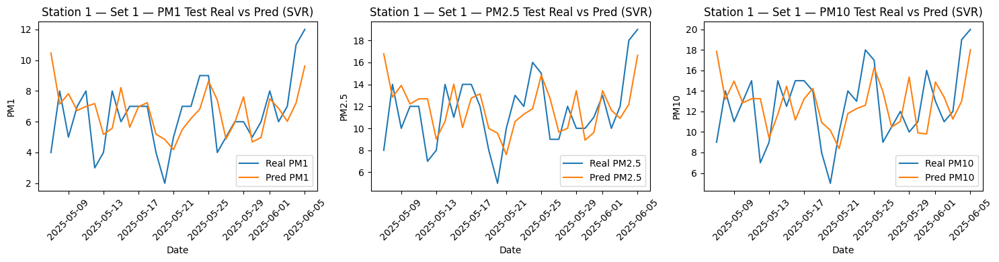

[SVR] TEST — Station 1 Set 2 — MAE PM1:2.069, PM2.5:3.005, PM10:3.650
[SVR] TRAIN — Station 1 Set 2 — MAE PM1:1.563, PM2.5:2.383, PM10:2.913


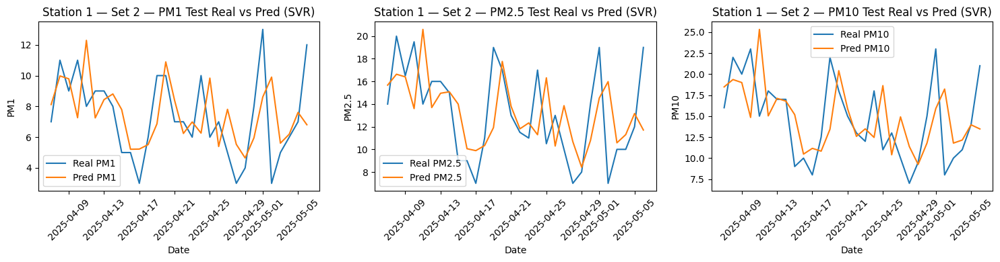

[SVR] TEST — Station 1 Set 3 — MAE PM1:3.851, PM2.5:6.311, PM10:7.831
[SVR] TRAIN — Station 1 Set 3 — MAE PM1:1.538, PM2.5:2.352, PM10:2.857


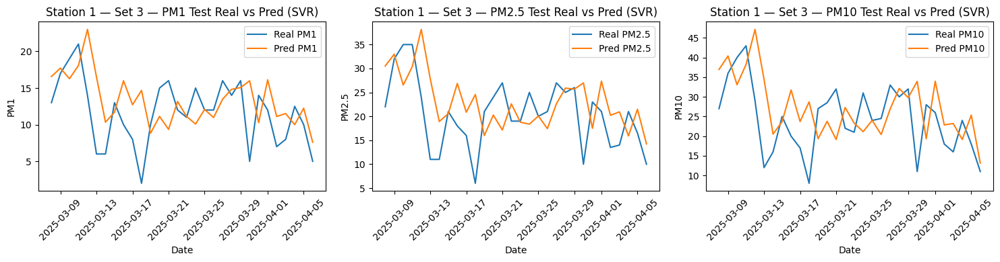

[SVR] TEST — Station 1 Set 4 — MAE PM1:5.736, PM2.5:9.698, PM10:12.223
[SVR] TRAIN — Station 1 Set 4 — MAE PM1:1.453, PM2.5:2.198, PM10:2.671


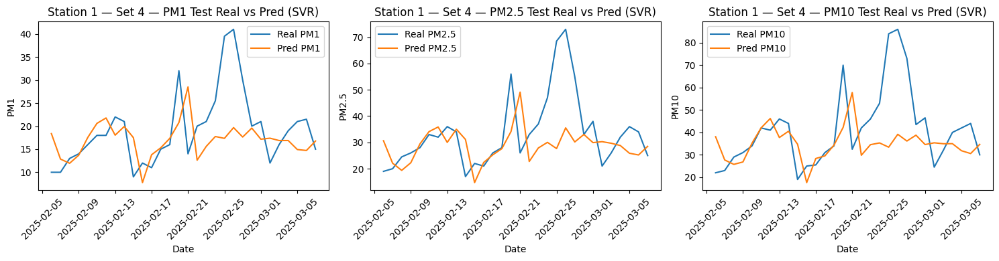

[SVR] TEST — Station 1 Set 5 — MAE PM1:9.186, PM2.5:14.872, PM10:18.417
[SVR] TRAIN — Station 1 Set 5 — MAE PM1:1.320, PM2.5:1.987, PM10:2.436


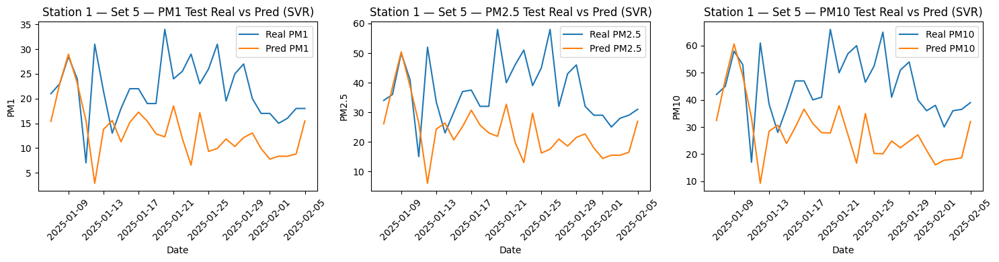


=== SVR for Station 2 ===
[SVR] TEST — Station 2 Set 1 — MAE PM1:0.562, PM2.5:0.775, PM10:0.807
[SVR] TRAIN — Station 2 Set 1 — MAE PM1:0.902, PM2.5:1.082, PM10:1.146


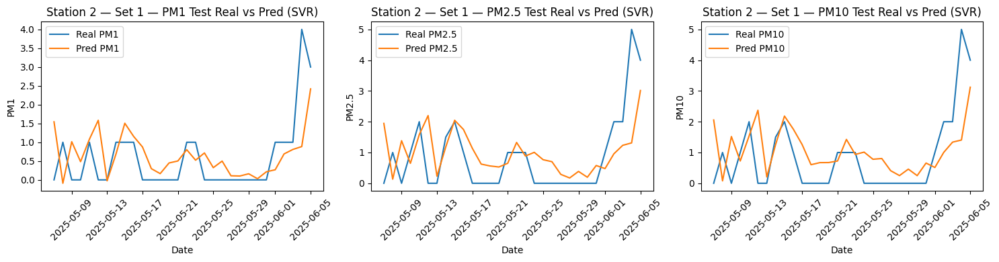

[SVR] TEST — Station 2 Set 2 — MAE PM1:0.866, PM2.5:0.944, PM10:0.973
[SVR] TRAIN — Station 2 Set 2 — MAE PM1:0.908, PM2.5:1.096, PM10:1.161


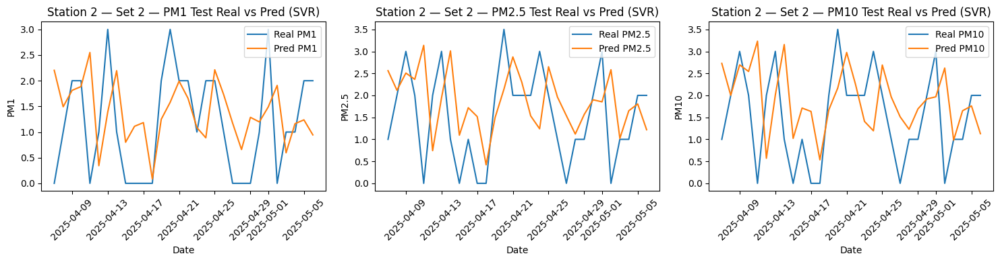

[SVR] TEST — Station 2 Set 3 — MAE PM1:1.976, PM2.5:2.479, PM10:2.730
[SVR] TRAIN — Station 2 Set 3 — MAE PM1:0.915, PM2.5:1.104, PM10:1.170


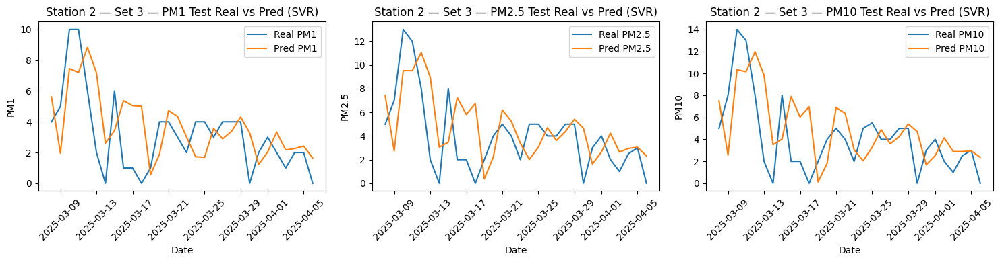

[SVR] TEST — Station 2 Set 4 — MAE PM1:3.657, PM2.5:4.198, PM10:4.609
[SVR] TRAIN — Station 2 Set 4 — MAE PM1:0.903, PM2.5:1.088, PM10:1.151


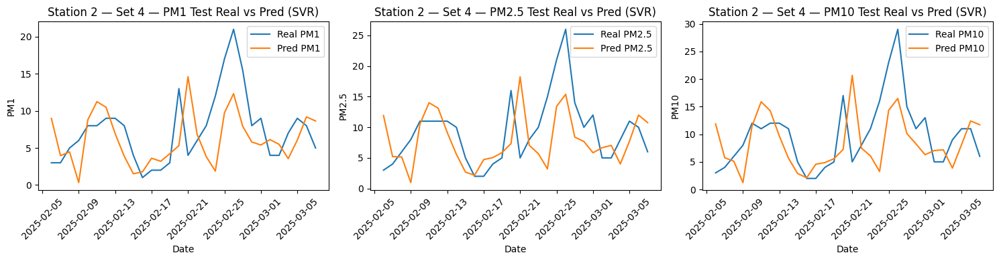

[SVR] TEST — Station 2 Set 5 — MAE PM1:4.575, PM2.5:5.593, PM10:6.264
[SVR] TRAIN — Station 2 Set 5 — MAE PM1:0.887, PM2.5:1.065, PM10:1.124


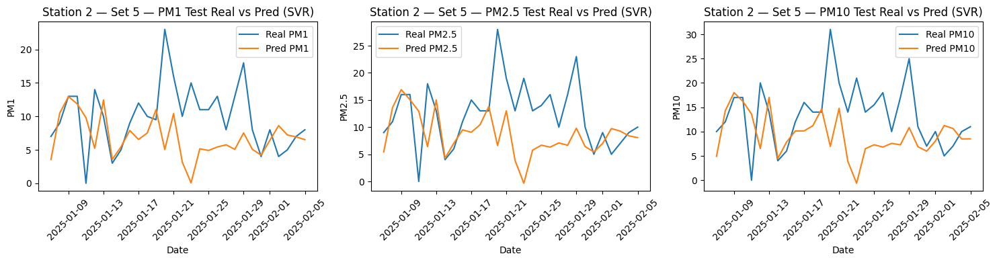


=== SVR for Station 3 ===
[SVR] TEST — Station 3 Set 1 — MAE PM1:1.101, PM2.5:1.522, PM10:1.575
[SVR] TRAIN — Station 3 Set 1 — MAE PM1:1.711, PM2.5:2.132, PM10:2.455


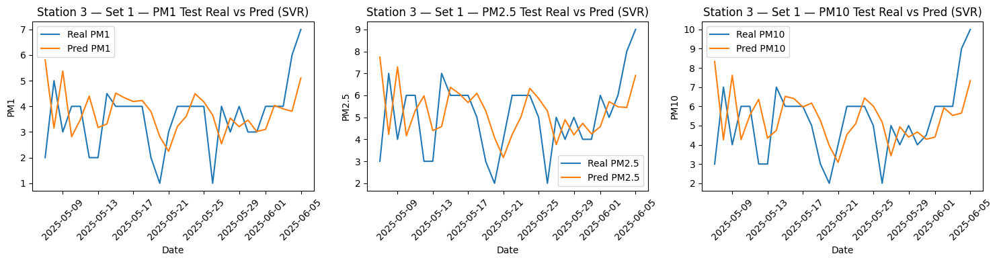

[SVR] TEST — Station 3 Set 2 — MAE PM1:1.599, PM2.5:1.921, PM10:2.337
[SVR] TRAIN — Station 3 Set 2 — MAE PM1:1.731, PM2.5:2.157, PM10:2.482


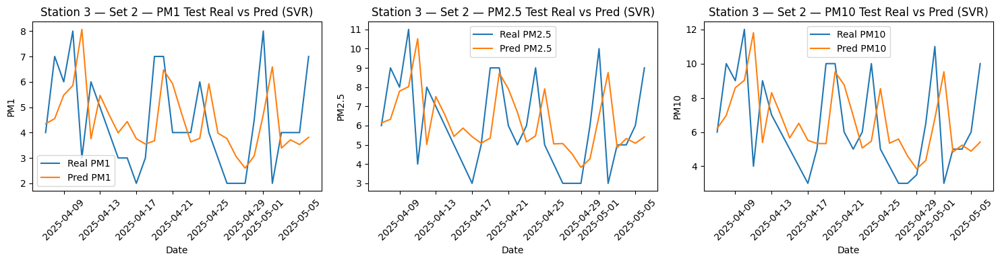

[SVR] TEST — Station 3 Set 3 — MAE PM1:3.499, PM2.5:4.414, PM10:5.002
[SVR] TRAIN — Station 3 Set 3 — MAE PM1:1.728, PM2.5:2.164, PM10:2.476


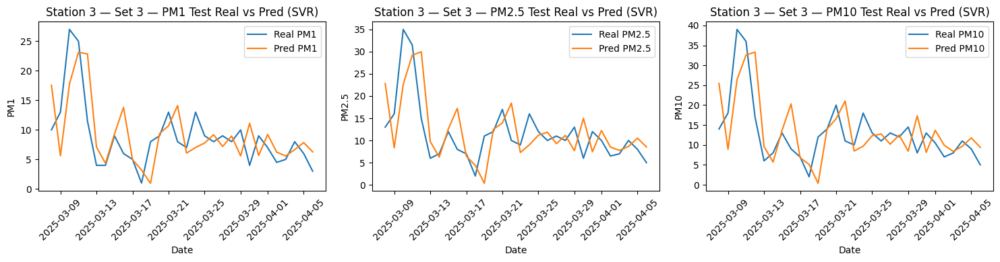

[SVR] TEST — Station 3 Set 4 — MAE PM1:8.242, PM2.5:10.016, PM10:11.859
[SVR] TRAIN — Station 3 Set 4 — MAE PM1:1.656, PM2.5:2.088, PM10:2.406


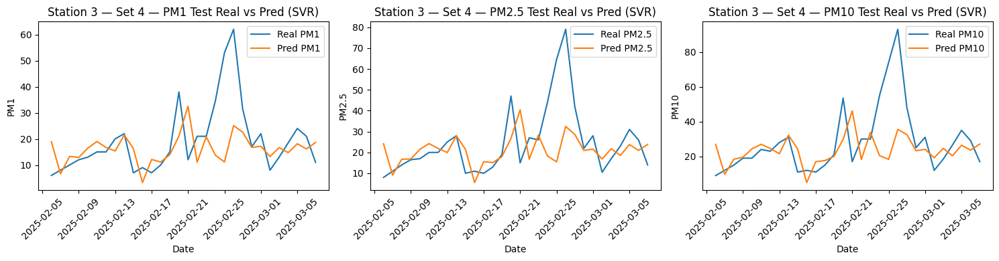

[SVR] TEST — Station 3 Set 5 — MAE PM1:8.136, PM2.5:9.917, PM10:12.068
[SVR] TRAIN — Station 3 Set 5 — MAE PM1:1.599, PM2.5:2.013, PM10:2.319


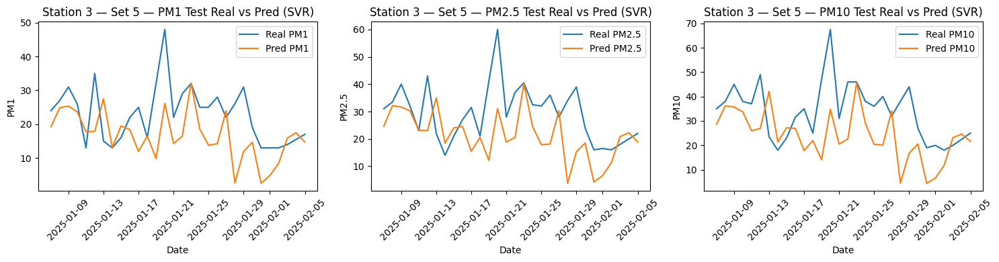


=== SVR for Station 4 ===
[SVR] TEST — Station 4 Set 1 — MAE PM1:1.565, PM2.5:2.513, PM10:2.572
[SVR] TRAIN — Station 4 Set 1 — MAE PM1:2.057, PM2.5:3.443, PM10:3.693


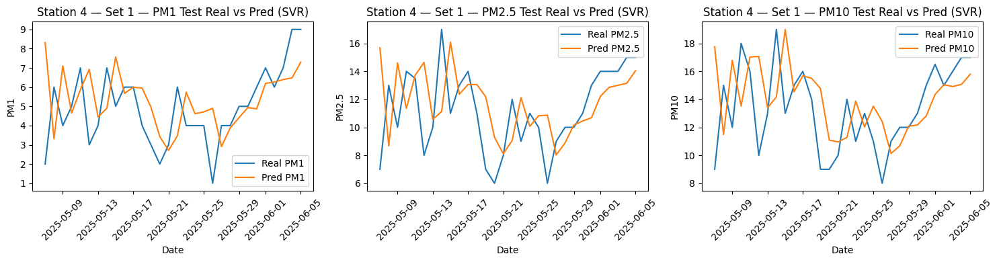

[SVR] TEST — Station 4 Set 2 — MAE PM1:2.477, PM2.5:4.221, PM10:4.352
[SVR] TRAIN — Station 4 Set 2 — MAE PM1:2.062, PM2.5:3.453, PM10:3.708


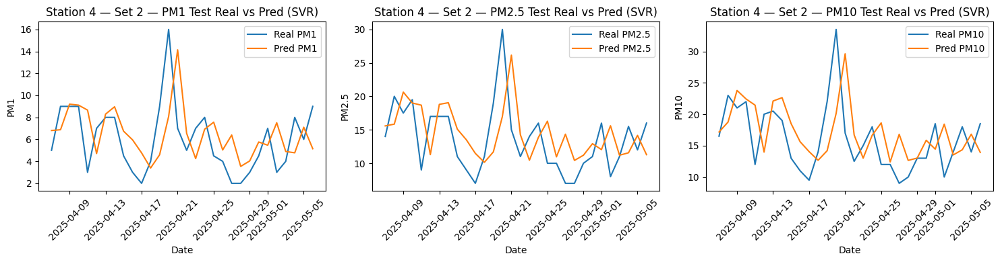

[SVR] TEST — Station 4 Set 3 — MAE PM1:5.629, PM2.5:9.797, PM10:10.906
[SVR] TRAIN — Station 4 Set 3 — MAE PM1:2.041, PM2.5:3.414, PM10:3.660


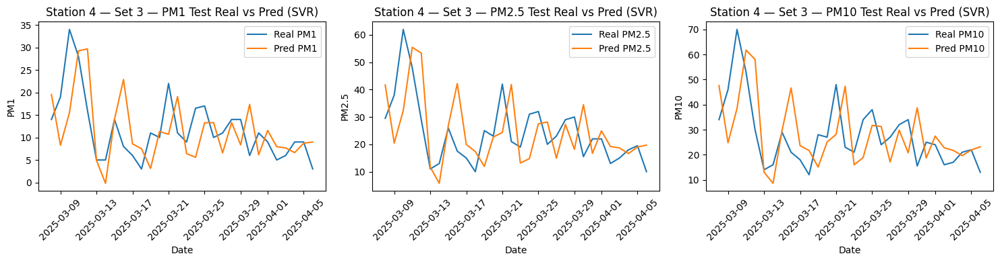

[SVR] TEST — Station 4 Set 4 — MAE PM1:8.894, PM2.5:16.175, PM10:17.676
[SVR] TRAIN — Station 4 Set 4 — MAE PM1:1.987, PM2.5:3.358, PM10:3.564


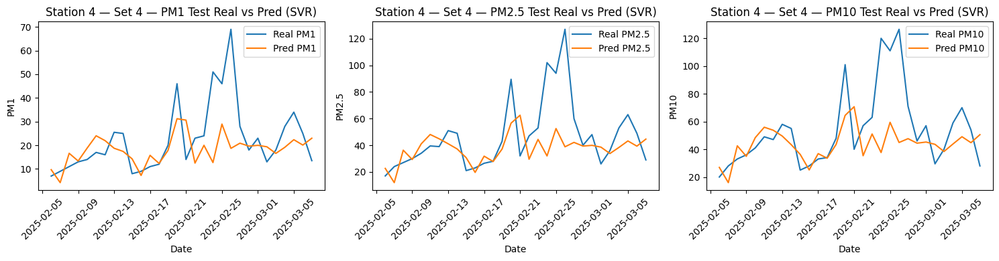

[SVR] TEST — Station 4 Set 5 — MAE PM1:12.336, PM2.5:20.221, PM10:21.850
[SVR] TRAIN — Station 4 Set 5 — MAE PM1:1.889, PM2.5:3.161, PM10:3.362


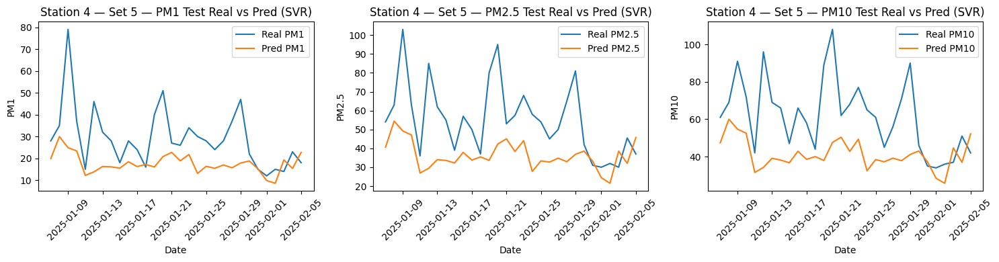


MAE on all stations and subsets (on TEST):
PM1: 4.3776
PM2.5: 6.5531
PM10: 7.5244


In [ ]:
svr_models = {}
all_svr_mae = []
for station in range(1,5):
    print(f"\n=== SVR for Station {station} ===")
    mae, model, scaler, data, dates = train_and_evaluate_svr(all_station_data[station], seq_length=10, station_id=station)
    all_svr_mae.extend(mae)
    svr_models[station] = (model, scaler, data, dates)

# Media MAE
if all_svr_mae:
    mean_mae = np.mean(all_svr_mae, axis=0)

    print("\nMAE on all stations and subsets (on TEST):")
    print(f"PM1: {mean_mae[0]:.4f}")
    print(f"PM2.5: {mean_mae[1]:.4f}")
    print(f"PM10: {mean_mae[2]:.4f}")
else:
    print("No results were obtained for calculating the MAE average.")

Enter the station number for which you want the prediction (1-4): 1


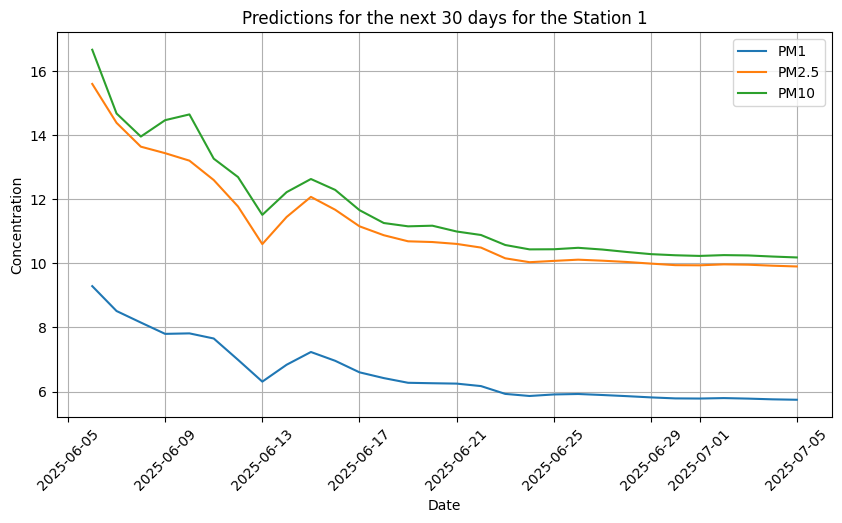

In [ ]:
station_input = int(input("Enter the station number for which you want the prediction (1-4): "))
model_pm1, model_pm25, model_pm10 = svr_models[station_input][0]
scaler = svr_models[station_input][1]
full_data = svr_models[station_input][2]
full_dates = svr_models[station_input][3]

seq = full_data[-10:]
scaled_seq = scaler.transform(seq)

current = scaled_seq.copy()
pred_scaled = []
for _ in range(30):
    flat = current.flatten()[None,:]
    p1 = model_pm1.predict(flat)
    p2 = model_pm25.predict(flat)
    p3 = model_pm10.predict(flat)
    pred = np.array([p1[0],p2[0],p3[0]])
    pred_scaled.append(pred)
    current = np.vstack([current[1:], pred])
predictions = scaler.inverse_transform(pred_scaled)

start = pd.to_datetime(full_dates[-1])
pred_dates = pd.date_range(start=start+pd.Timedelta(days=1), periods=30)
plt.figure(figsize=(10,5))
plt.plot(pred_dates, predictions[:,0], label='PM1')
plt.plot(pred_dates, predictions[:,1], label='PM2.5')
plt.plot(pred_dates, predictions[:,2], label='PM10')
plt.title(f'Predictions for the next 30 days for the Station {station_input}')
plt.xlabel('Date')
plt.ylabel('Concentration')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [ ]:
def predict_next_30_days(model_type, station_input):
    seq_length = 10

    if model_type == 1:  # LSTM
        model, scaler, full_data, full_dates = lstm_models[station_input]
        recent_seq = full_data[-seq_length:]
        scaled_recent_seq = scaler.transform(recent_seq)
        predictions_scaled = []
        current_seq = scaled_recent_seq.copy()

        for _ in range(30):
            pred = model.predict(np.expand_dims(current_seq, axis=0), verbose=0)
            predictions_scaled.append(pred[0])
            current_seq = np.vstack([current_seq[1:], pred])

        predictions = scaler.inverse_transform(predictions_scaled)
        title = f'LSTM – Station {station_input}'

    elif model_type == 2:  # Linear Regression
        model, scaler, full_data, full_dates = lr_models[station_input]
        recent_seq = full_data[-seq_length:]
        scaled_recent_seq = scaler.transform(recent_seq)
        predictions_scaled = []
        current_seq = scaled_recent_seq.copy()

        for _ in range(30):
            X_input = current_seq.flatten().reshape(1, -1)
            pred = model.predict(X_input)
            predictions_scaled.append(pred[0])
            current_seq = np.vstack([current_seq[1:], pred])

        predictions = scaler.inverse_transform(predictions_scaled)
        title = f'Linear Regression – Station {station_input}'

    elif model_type == 3:  # Random Forest
        model, scaler, full_data, full_dates = rf_models[station_input]
        recent_seq = full_data[-seq_length:]
        scaled_recent_seq = scaler.transform(recent_seq)
        predictions_scaled = []
        current_seq = scaled_recent_seq.copy()

        for _ in range(30):
            X_input = current_seq.flatten().reshape(1, -1)
            pred = model.predict(X_input)
            predictions_scaled.append(pred[0])
            current_seq = np.vstack([current_seq[1:], pred])

        predictions = scaler.inverse_transform(predictions_scaled)
        title = f'Random Forest – Station {station_input}'

    elif model_type == 4:  # SVR
        model_pm1, model_pm25, model_pm10 = svr_models[station_input][0]
        scaler = svr_models[station_input][1]
        full_data = svr_models[station_input][2]
        full_dates = svr_models[station_input][3]

        recent_seq = full_data[-seq_length:]
        scaled_recent_seq = scaler.transform(recent_seq)
        current_seq = scaled_recent_seq.copy()
        predictions_scaled = []

        for _ in range(30):
            flat_input = current_seq.flatten().reshape(1, -1)
            p1 = model_pm1.predict(flat_input)
            p2 = model_pm25.predict(flat_input)
            p3 = model_pm10.predict(flat_input)
            pred = np.array([p1[0], p2[0], p3[0]])
            predictions_scaled.append(pred)
            current_seq = np.vstack([current_seq[1:], pred])

        predictions = scaler.inverse_transform(predictions_scaled)
        title = f'SVR – Station {station_input}'

    else:
        print("Invalid model.")
        return

    # Dates for the next 30 days
    start_date = pd.to_datetime(full_dates[-1])
    pred_dates = pd.date_range(start=start_date + pd.Timedelta(days=1), periods=30)

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(pred_dates, predictions[:, 0], label='PM1')
    plt.plot(pred_dates, predictions[:, 1], label='PM2.5')
    plt.plot(pred_dates, predictions[:, 2], label='PM10')
    plt.title(f'Predictions for the next 30 days — {title}')
    plt.xlabel('Date')
    plt.ylabel('Concentration')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.show()


=== PREDICTION ===
Stations available: 1, 2, 3, 4
Models available:
 1 - LSTM
 2 - Linear Regression
 3 - Random Forest
 4 - SVR
Choose station (1-4): 1
Choose the prediction model (1-4): 4


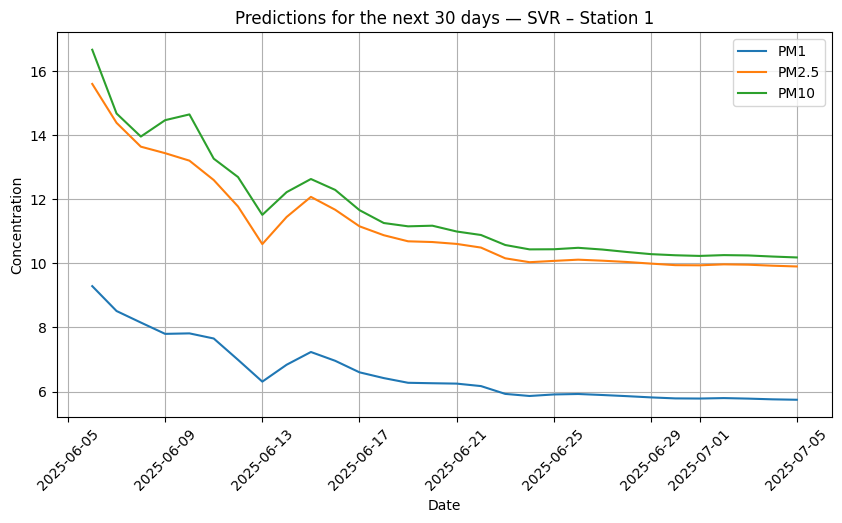

In [ ]:
# Meniu interactiv principal
print("\n=== PREDICTION ===")
print("Stations available: 1, 2, 3, 4")
print("Models available:")
print(" 1 - LSTM")
print(" 2 - Linear Regression")
print(" 3 - Random Forest")
print(" 4 - SVR")

try:
    station_input = int(input("Choose station (1-4): "))
    assert station_input in [1, 2, 3, 4], "Invalid station."

    model_input = int(input("Choose the prediction model (1-4): "))
    assert model_input in [1, 2, 3, 4], "Invalid model."

    predict_next_30_days(model_input, station_input)

except Exception as e:
    print(f"Eroare: {e}")